In [1]:
import pandas as pd
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.model_selection import train_test_split


In [2]:
housing = pd.read_csv("C:/Users/choun/Jupyter_Notebook/House.csv")
housing

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [3]:
housing.shape

(1460, 81)

In [4]:
housing = housing.drop(columns=["Id"])
housing

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [5]:
i=1
for col in housing.columns:
    print(i," ",col)
    i=i+1

1   MSSubClass
2   MSZoning
3   LotFrontage
4   LotArea
5   Street
6   Alley
7   LotShape
8   LandContour
9   Utilities
10   LotConfig
11   LandSlope
12   Neighborhood
13   Condition1
14   Condition2
15   BldgType
16   HouseStyle
17   OverallQual
18   OverallCond
19   YearBuilt
20   YearRemodAdd
21   RoofStyle
22   RoofMatl
23   Exterior1st
24   Exterior2nd
25   MasVnrType
26   MasVnrArea
27   ExterQual
28   ExterCond
29   Foundation
30   BsmtQual
31   BsmtCond
32   BsmtExposure
33   BsmtFinType1
34   BsmtFinSF1
35   BsmtFinType2
36   BsmtFinSF2
37   BsmtUnfSF
38   TotalBsmtSF
39   Heating
40   HeatingQC
41   CentralAir
42   Electrical
43   1stFlrSF
44   2ndFlrSF
45   LowQualFinSF
46   GrLivArea
47   BsmtFullBath
48   BsmtHalfBath
49   FullBath
50   HalfBath
51   BedroomAbvGr
52   KitchenAbvGr
53   KitchenQual
54   TotRmsAbvGrd
55   Functional
56   Fireplaces
57   FireplaceQu
58   GarageType
59   GarageYrBlt
60   GarageFinish
61   GarageCars
62   GarageArea
63   GarageQual
64   GarageC

In [6]:
housing.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


# Numerical variables

In [7]:
nume_cols = housing.select_dtypes(include=['number'])
print("Number of Numerical Columns   : ",len(nume_cols.columns))

Number of Numerical Columns   :  37


In [8]:
nume_cols.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


## Categorical variable

In [9]:
cat_cols = housing.select_dtypes(exclude=['number'])
print("Number of Categorical Columns : ",len(cat_cols.columns))

Number of Categorical Columns :  43


In [10]:
cat_cols.describe()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,...,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,...,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,...,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1151,1454,50,925,1311,1459,1052,1382,225,1260,...,870,605,1311,1326,1340,3,157,49,1267,1198


# Data cleaning for num cols

In [11]:
nume_cols.isna().sum()

MSSubClass         0
LotFrontage      259
LotArea            0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
MasVnrArea         8
BsmtFinSF1         0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr       0
TotRmsAbvGrd       0
Fireplaces         0
GarageYrBlt       81
GarageCars         0
GarageArea         0
WoodDeckSF         0
OpenPorchSF        0
EnclosedPorch      0
3SsnPorch          0
ScreenPorch        0
PoolArea           0
MiscVal            0
MoSold             0
YrSold             0
SalePrice          0
dtype: int64

# We see that LotFrontage, GarageYrBlt, MasVnrArea has missing values.     
#### Treating MasVnrArea, LotFrontage with Iterative Imputer method is a reasonable approach.

In [12]:
in_col = ['LotFrontage', 'GarageYrBlt', 'MasVnrArea']
nume_cols[in_col].describe()

,LotFrontage,GarageYrBlt,MasVnrArea
count,1201.000000,1379.000000,1452.000000
mean,70.049958,1978.506164,103.685262
std,24.284752,24.689725,181.066207
min,21.000000,1900.000000,0.000000
25%,59.000000,1961.000000,0.000000
50%,69.000000,1980.000000,0.000000
75%,80.000000,2002.000000,166.000000
max,313.000000,2010.000000,1600.000000


In [13]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imputer = IterativeImputer(max_iter=10, random_state=0)
nume_cols[["MasVnrArea", "LotFrontage"]] = imputer.fit_transform(nume_cols[["MasVnrArea", "LotFrontage"]])

In [14]:
nume_cols.isna().sum()

MSSubClass        0
LotFrontage       0
LotArea           0
OverallQual       0
OverallCond       0
YearBuilt         0
YearRemodAdd      0
MasVnrArea        0
BsmtFinSF1        0
BsmtFinSF2        0
BsmtUnfSF         0
TotalBsmtSF       0
1stFlrSF          0
2ndFlrSF          0
LowQualFinSF      0
GrLivArea         0
BsmtFullBath      0
BsmtHalfBath      0
FullBath          0
HalfBath          0
BedroomAbvGr      0
KitchenAbvGr      0
TotRmsAbvGrd      0
Fireplaces        0
GarageYrBlt      81
GarageCars        0
GarageArea        0
WoodDeckSF        0
OpenPorchSF       0
EnclosedPorch     0
3SsnPorch         0
ScreenPorch       0
PoolArea          0
MiscVal           0
MoSold            0
YrSold            0
SalePrice         0
dtype: int64

In [15]:
in_col = ['LotFrontage', 'GarageYrBlt', 'MasVnrArea']
nume_cols[in_col].describe()

,LotFrontage,GarageYrBlt,MasVnrArea
count,1460.000000,1379.000000,1460.000000
mean,70.074162,1978.506164,103.712384
std,22.087067,24.689725,180.586485
min,21.000000,1900.000000,0.000000
25%,60.000000,1961.000000,0.000000
50%,68.248842,1980.000000,0.000000
75%,79.299885,2002.000000,165.112121
max,313.000000,2010.000000,1600.000000


#  But, is it appropriate to use Iterative method for treating missing values for GarageYrBlt?

- Using Iterative imputation for imputing missing values in the "GarageYrBlt" variable may not be the most appropriate method, primarily due to the nature of the variable.
- "GarageYrBlt" represents the year a garage was built. This variable is typically a discrete numeric variable, as it represents specific years. Iterative imputation  is commonly used for imputing missing values in continuous or categorical variables. Imputing missing years with Iterative method may lead to imputed values that don't make sense in the context of year-based data.
- Instead, for "GarageYrBlt," it's more appropriate to use regression imputations.

# Regression Imputation:
### In this approach, we would build a regression model where "GarageYrBlt" is the dependent variable, and other relevant variables (e.g., "YearBuilt," "OverallQual," etc.) are used as independent predictors.
- The model is trained using rows where "GarageYrBlt" is not missing.
- Once the model is trained, we can use it to predict the missing values of "GarageYrBlt" based on the values of the predictor variables in rows where "GarageYrBlt" is missing.

##### Takes into account the relationships between the variables and can provide more accurate imputations if there's a strong relationship between "GarageYrBlt" and the predictors.

###### -->how do we know  if there's a strong relationship between "GarageYrBlt" and the predictors.
###### Correlation Analysis: Calculate the correlation between "GarageYrBlt" and all other numerical variables in the dataset.
##### Variables with a high positive or negative correlation with "GarageYrBlt" are potential candidates for predictors.



In [16]:
correlation_matrix = nume_cols.corr()
garage_year_built_corr = correlation_matrix["GarageYrBlt"].sort_values(ascending=False)
garage_year_built_corr

GarageYrBlt      1.000000
YearBuilt        0.825667
YearRemodAdd     0.642277
GarageCars       0.588920
GarageArea       0.564567
OverallQual      0.547766
SalePrice        0.486362
FullBath         0.484557
TotalBsmtSF      0.322445
MasVnrArea       0.251937
1stFlrSF         0.233449
GrLivArea        0.231197
OpenPorchSF      0.228425
WoodDeckSF       0.224577
HalfBath         0.196785
BsmtUnfSF        0.190708
BsmtFinSF1       0.153484
TotRmsAbvGrd     0.148112
BsmtFullBath     0.124553
MSSubClass       0.085072
2ndFlrSF         0.070832
LotFrontage      0.068205
Fireplaces       0.046822
3SsnPorch        0.023544
MoSold           0.005337
YrSold          -0.001014
PoolArea        -0.014501
LotArea         -0.024947
MiscVal         -0.032417
LowQualFinSF    -0.036363
BedroomAbvGr    -0.064518
ScreenPorch     -0.075418
BsmtHalfBath    -0.077464
BsmtFinSF2      -0.088011
KitchenAbvGr    -0.124411
EnclosedPorch   -0.297003
OverallCond     -0.324297
Name: GarageYrBlt, dtype: float64

#### So, for regression imputation of "GarageYrBlt," we can start with the following predictor variables:

- "YearBuilt"
- "YearRemodAdd"
- "GarageCars"
- "GarageArea"
- "OverallQual"
- "SalePrice"
- "FullBath"
- "TotalBsmtSF"
- "OverallCond"
- "EnclosedPorch"

### Handle missing values in "GarageYrBlt" using regression imputation:

In [17]:
from sklearn.linear_model import LinearRegression

lm_model = LinearRegression()

predictor_vars = ["YearBuilt", "YearRemodAdd", "GarageCars","GarageArea", "OverallQual","SalePrice","FullBath","TotalBsmtSF","OverallCond","EnclosedPorch"]

# Filter the dataset to include only rows with non-missing "GarageYrBlt" values
filtered_data = nume_cols[~nume_cols["GarageYrBlt"].isnull()]

# Train the regression model
lm_model.fit(filtered_data[predictor_vars], filtered_data["GarageYrBlt"])

# Use the trained model to predict missing "GarageYrBlt" values
missing_data = nume_cols[nume_cols["GarageYrBlt"].isnull()][predictor_vars]
imputed_GarageYrBlt = lm_model.predict(missing_data)

# Replace missing values with imputed values in the original dataset
nume_cols.loc[nume_cols["GarageYrBlt"].isnull(), "GarageYrBlt"] = imputed_GarageYrBlt

In [18]:
nume_cols.isnull().sum()

MSSubClass       0
LotFrontage      0
LotArea          0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
MasVnrArea       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
TotRmsAbvGrd     0
Fireplaces       0
GarageYrBlt      0
GarageCars       0
GarageArea       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
SalePrice        0
dtype: int64

# Categorical variables

In [19]:
cat_cols.isnull().sum()

MSZoning            0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinType2       38
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
KitchenQual         0
Functional          0
FireplaceQu       690
GarageType         81
GarageFinish       81
GarageQual         81
GarageCond         81
PavedDrive          0
PoolQC           1453
Fence            1179
MiscFeature      1406
SaleType            0
SaleCondition       0
dtype: int64

##### Lets remove the variables with large number of missing values as they are irrelevant in predicting the target variable.

In [20]:
cat_cols = cat_cols.drop(columns=["Alley", "PoolQC", "Fence", "MiscFeature","FireplaceQu"])

In [21]:
cat_cols.isnull().sum()

MSZoning          0
Street            0
LotShape          0
LandContour       0
Utilities         0
LotConfig         0
LandSlope         0
Neighborhood      0
Condition1        0
Condition2        0
BldgType          0
HouseStyle        0
RoofStyle         0
RoofMatl          0
Exterior1st       0
Exterior2nd       0
MasVnrType        8
ExterQual         0
ExterCond         0
Foundation        0
BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinType2     38
Heating           0
HeatingQC         0
CentralAir        0
Electrical        1
KitchenQual       0
Functional        0
GarageType       81
GarageFinish     81
GarageQual       81
GarageCond       81
PavedDrive        0
SaleType          0
SaleCondition     0
dtype: int64

Now we need to treat the missing values of variables:
+ MasVnrType        8
+ BsmtQual         37
+ BsmtCond         37
+ BsmtExposure     38
+ BsmtFinType1     37
+ BsmtFinType2     38
+ Electrical        1
+ GarageType       81
+ GarageFinish     81
+ GarageQual       81
+ GarageCond       81

To treat the missing values in these variables we can consider the Mode Imputation:

Mode Imputation: Replace missing values with the mode (most frequent category) of the respective variable. This is a common method for handling missing categorical data.

Why we used mode imputation here?

No Assumption of Relationships: Here in our dataset we does not capture any relationships between the missing categorical variables and other predictors. These variables are missing completely at random and their missingness is not related to the values of other variables, mode imputation can be a reasonable approach.

In [22]:
#Separate categorical columns with missing values
categorical_cols_with_missing = ["MasVnrType","BsmtQual","BsmtCond","BsmtExposure","BsmtFinType1","BsmtFinType2","Electrical","GarageType","GarageFinish","GarageQual","GarageCond"]

# Fill missing values with the mode for each variable
for col in categorical_cols_with_missing:
    mode_value = cat_cols[col].mode()[0]
    cat_cols[col].fillna(mode_value, inplace=True)

In [23]:
cat_cols.isnull().sum()

MSZoning         0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinType2     0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
KitchenQual      0
Functional       0
GarageType       0
GarageFinish     0
GarageQual       0
GarageCond       0
PavedDrive       0
SaleType         0
SaleCondition    0
dtype: int64

In [24]:
house = pd.DataFrame()
house = pd.concat([cat_cols, nume_cols], axis=1)
house.shape

(1460, 75)

In [25]:
unique_values= {}
for column in sorted(house.select_dtypes(include='object').columns):
    unique_values = sorted(house[column].unique())
    #print(f"Unique values in {column}: {unique_values}")
    print(f"Unique values in : \033[91m {column} \033[0m  Unique Values:\033[92m {unique_values}\033[0m ")

Unique values in :  BldgType   Unique Values: ['1Fam', '2fmCon', 'Duplex', 'Twnhs', 'TwnhsE'] 
Unique values in :  BsmtCond   Unique Values: ['Fa', 'Gd', 'Po', 'TA'] 
Unique values in :  BsmtExposure   Unique Values: ['Av', 'Gd', 'Mn', 'No'] 
Unique values in :  BsmtFinType1   Unique Values: ['ALQ', 'BLQ', 'GLQ', 'LwQ', 'Rec', 'Unf'] 
Unique values in :  BsmtFinType2   Unique Values: ['ALQ', 'BLQ', 'GLQ', 'LwQ', 'Rec', 'Unf'] 
Unique values in :  BsmtQual   Unique Values: ['Ex', 'Fa', 'Gd', 'TA'] 
Unique values in :  CentralAir   Unique Values: ['N', 'Y'] 
Unique values in :  Condition1   Unique Values: ['Artery', 'Feedr', 'Norm', 'PosA', 'PosN', 'RRAe', 'RRAn', 'RRNe', 'RRNn'] 
Unique values in :  Condition2   Unique Values: ['Artery', 'Feedr', 'Norm', 'PosA', 'PosN', 'RRAe', 'RRAn', 'RRNn'] 
Unique values in :  Electrical   Unique Values: ['FuseA', 'FuseF', 'FuseP', 'Mix', 'SBrkr'] 
Unique values in :  ExterCond   Unique Values: ['Ex', 'Fa', 'Gd', 'Po', 'TA'] 
Unique values in :  Ext

In [26]:
combined_df = pd.concat([cat_cols, nume_cols], axis=1)
fn_df1 = pd.concat([cat_cols, nume_cols], axis=1)
fn_df = pd.concat([cat_cols, nume_cols], axis=1)
df = pd.concat([cat_cols, nume_cols], axis=1)

cat_colnames = cat_cols.columns
print("Number of categorical columns : ",len(cat_colnames),"\n")
print(cat_colnames)

print("---------------------------------------------------------------------------------------")
num_colnames = nume_cols.columns
print("Number of Numerical columns : ",len(num_colnames),"\n")
print(num_colnames)



Number of categorical columns :  38 

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
       'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')
---------------------------------------------------------------------------------------
Number of Numerical columns :  37 

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       '

# Ploting for Categorical variables

C:\Users\choun\AppData\Local\Temp\ipykernel_28456\3980396546.py:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(11,4,index)


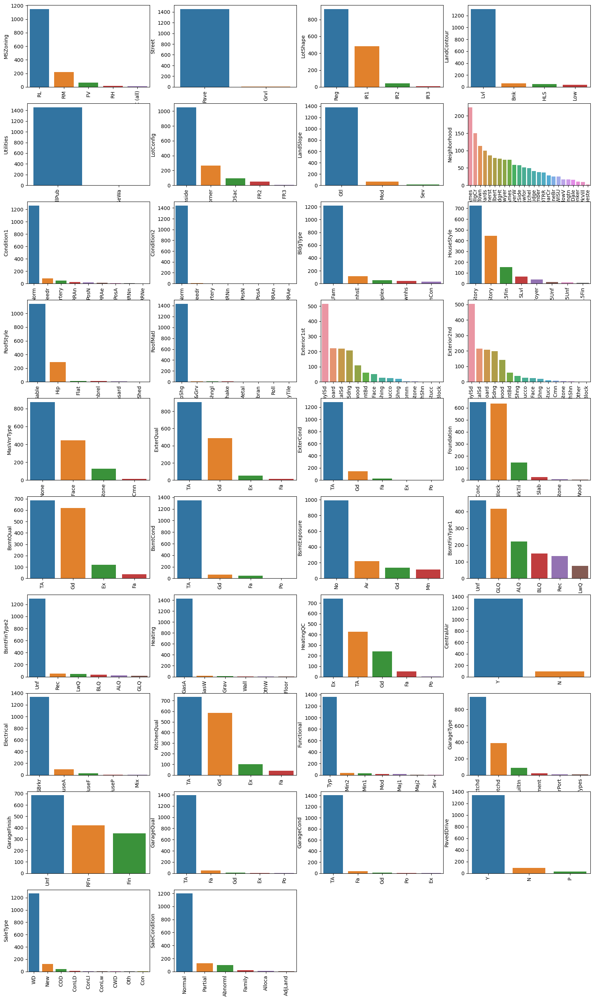

In [27]:
plt.figure(figsize=(20,38))
plt.title('Categorical Features: Distribution')
plt.xticks(rotation=90)
index = 1
for col in cat_colnames:
    y = combined_df[col].value_counts()
    plt.subplot(11,4,index)
    plt.xticks(rotation=90)
    sns.barplot(x=list(y.index), y=y)
    index +=1

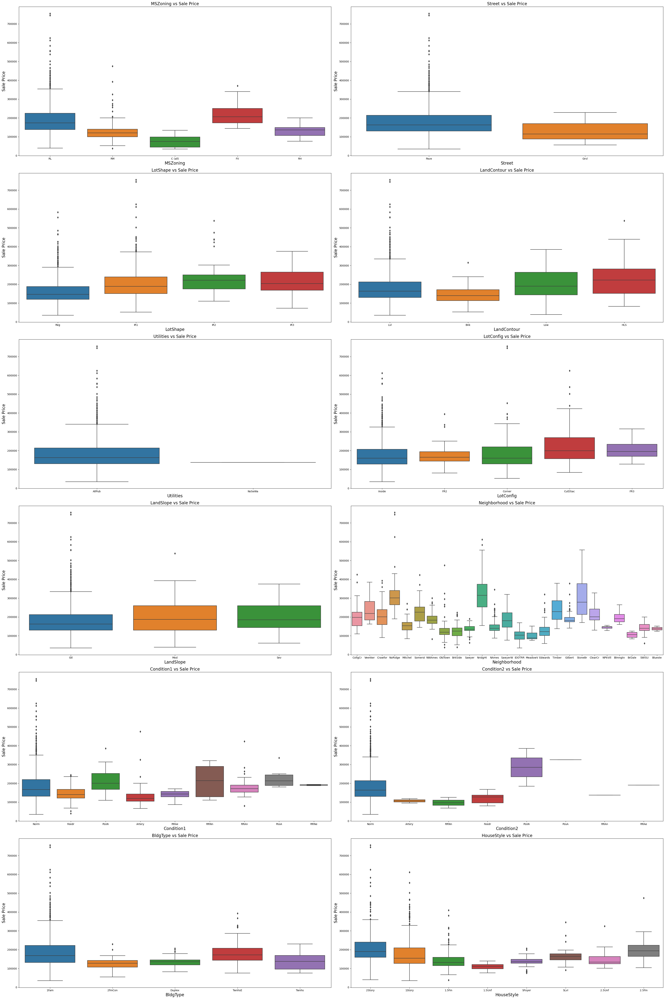

In [28]:
num_rows = 6
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(36, 54))
axes=axes.flatten()
for i,cat in enumerate(cat_colnames[:12]):
    sns.boxplot(x=cat, y='SalePrice', data=combined_df,ax=axes[i])
    axes[i].set_title('{} vs Sale Price'.format(cat),fontsize=16)
    axes[i].set_xlabel(cat, fontsize=16)  # Adjust the font size of x-label
    axes[i].set_ylabel('Sale Price', fontsize=16)
plt.tight_layout()
plt.show()

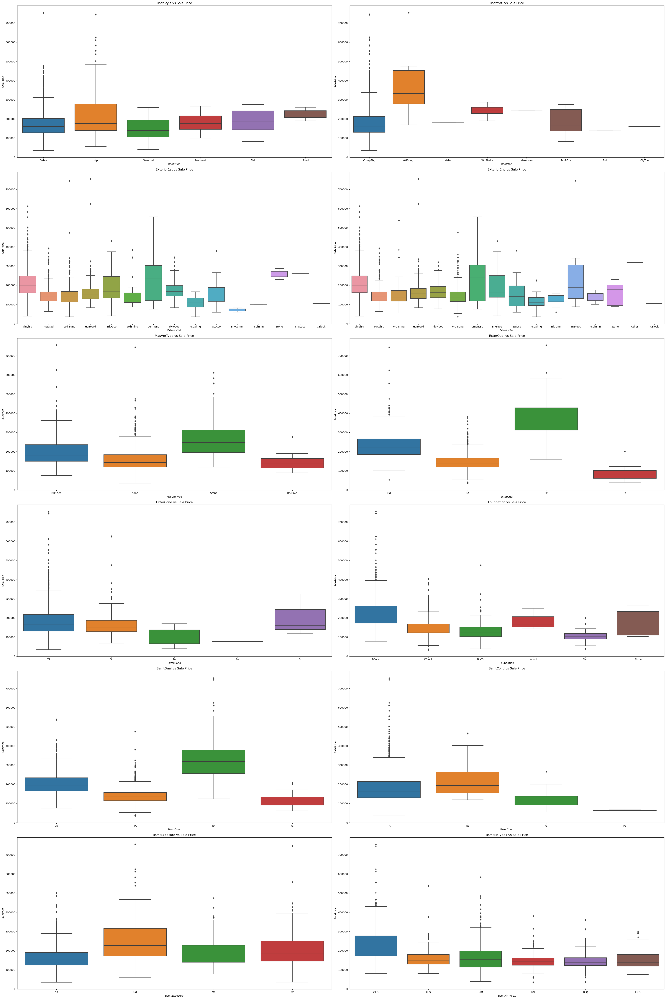

In [29]:
num_rows = 6
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(36, 54))
axes=axes.flatten()
for i,cat in enumerate(cat_colnames[12:24]):
    sns.boxplot(x=cat, y='SalePrice', data=combined_df,ax=axes[i])
    axes[i].set_title('{} vs Sale Price'.format(cat))
plt.tight_layout()
plt.show()

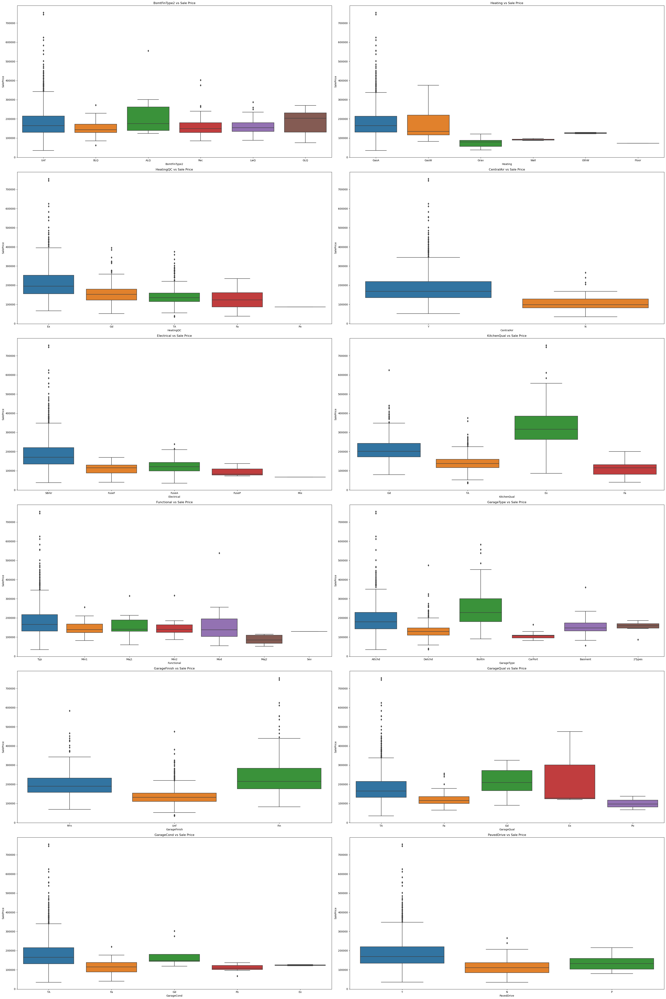

In [30]:
num_rows = 6
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(36, 54))
axes=axes.flatten()
for i,cat in enumerate(cat_colnames[24:36]):
    sns.boxplot(x=cat, y='SalePrice', data=combined_df,ax=axes[i])
    axes[i].set_title('{} vs Sale Price'.format(cat))
plt.tight_layout()
plt.show()

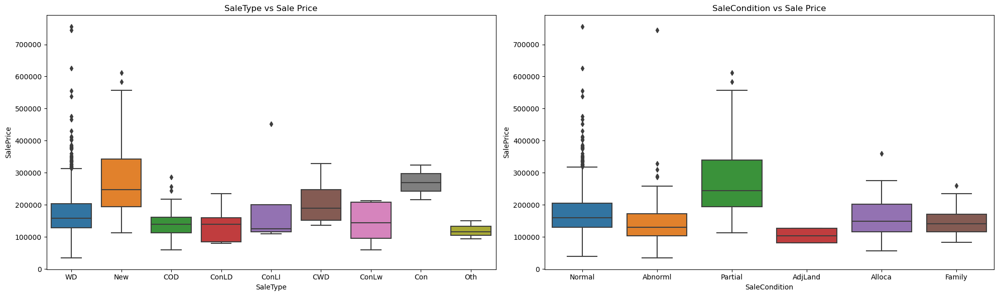

In [31]:
num_rows = 1
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 6))
axes=axes.flatten()
for i,cat in enumerate(cat_colnames[36:]):
    sns.boxplot(x=cat, y='SalePrice', data=combined_df,ax=axes[i])
    axes[i].set_title('{} vs Sale Price'.format(cat))
plt.tight_layout()
plt.show()

In [32]:
nume_cols.columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [33]:
fn_df1 = pd.concat([cat_cols,nume_cols],axis=1)
fn_df2 = pd.concat([cat_cols,nume_cols],axis=1)

fn_df1.columns

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
       'PavedDrive', 'SaleType', 'SaleCondition', 'MSSubClass', 'LotFrontage',
       'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea',
     

## Removing outliers using Z distribution with cut off alpha= 0.01 i.e., z = 3

In [34]:
import pandas as pd
from scipy import stats
import numpy as np

# Assuming your DataFrame is named 'df'
# Replace 'df' with the actual name of your DataFrame

# Function to remove outliers using Z-score for all columns
def remove_outliers_zscore(df, threshold=3):
    df1 = df
    numerical_columns = df.select_dtypes(include=['number']).columns
    z_scores = np.abs(stats.zscore(df[numerical_columns]))
    outlier_rows = (z_scores > threshold).any(axis=1)
    df_no_outliers = df1[~outlier_rows]
    # Keep all columns (numerical and categorical) in the final output
    #df_no_outliers = pd.concat([df_no_outliers_numeric, df.select_dtypes(exclude=['number'])], axis=1)
    return df_no_outliers

# Apply the function to your DataFrame
df_no_outliers = remove_outliers_zscore(fn_df1)

# Display the shape before and after removing outliers
print("Original DataFrame shape:", fn_df1.shape)
print("DataFrame shape after removing outliers:", df_no_outliers.shape)

Original DataFrame shape: (1460, 75)
DataFrame shape after removing outliers: (1015, 75)


In [35]:
df1 = df_no_outliers
df1

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,0,61,0,0,0,0,0,2,2008,208500
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,0,42,0,0,0,0,0,9,2008,223500
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,192,84,0,0,0,0,0,12,2008,250000
6,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,...,255,57,0,0,0,0,0,8,2007,307000
10,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,...,0,0,0,0,0,0,0,2,2008,129500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,RM,Pave,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,...,0,28,0,0,0,0,0,5,2006,145000
1453,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,...,36,56,0,0,0,0,0,7,2006,84500
1454,FV,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,...,0,113,0,0,0,0,0,10,2009,185000
1455,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,...,0,40,0,0,0,0,0,8,2007,175000


In [36]:
df1.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1015.000000,1015.000000,1015.000000,1015.000000,1015.000000,1015.000000,1015.000000,1015.000000,1015.000000,1015.000000,...,1015.000000,1015.000000,1015.000000,1015.00000,1015.000000,1015.0,1015.000000,1015.000000,1015.000000,1015.000000
mean,53.931034,67.385901,9139.664039,6.072906,5.521182,1975.111330,1986.039409,82.804847,413.388177,18.672906,...,87.697537,42.044335,14.881773,0.02266,5.989163,0.0,14.782266,6.252217,2007.813793,172714.054187
std,40.369535,18.318018,3634.390581,1.314689,0.984743,29.052194,20.737640,129.936318,403.773301,75.643182,...,107.115075,53.355521,43.116257,0.72193,28.824383,0.0,101.436540,2.681560,1.343333,63514.906369
min,20.000000,21.000000,1300.000000,2.000000,3.000000,1885.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,1.000000,2006.000000,35311.000000
25%,20.000000,60.000000,7200.000000,5.000000,5.000000,1956.000000,1968.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,4.000000,2007.000000,128000.000000
50%,50.000000,67.488420,9066.000000,6.000000,5.000000,1977.000000,1996.000000,0.000000,386.000000,0.000000,...,0.000000,27.000000,0.000000,0.00000,0.000000,0.0,0.000000,6.000000,2008.000000,160000.000000
75%,60.000000,77.000000,10996.000000,7.000000,6.000000,2003.000000,2004.000000,144.500000,695.000000,0.000000,...,167.000000,63.000000,0.000000,0.00000,0.000000,0.0,0.000000,8.000000,2009.000000,206950.000000
max,180.000000,134.000000,29959.000000,10.000000,8.000000,2009.000000,2010.000000,640.000000,1646.000000,506.000000,...,468.000000,244.000000,205.000000,23.00000,182.000000,0.0,1300.000000,12.000000,2010.000000,402861.000000


In [37]:
nume_cols = df_no_outliers.select_dtypes(include=['number'])
cat_cols = df_no_outliers.select_dtypes(exclude=['number'])
dfc1 = df_no_outliers
dfc2 = df_no_outliers
nume_cols.shape, cat_cols.shape

((1015, 37), (1015, 38))

In [38]:
num_colnames = nume_cols.columns
num_colnames

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

### Chi Square test for categorical variables

In [39]:
from scipy.stats import chi2_contingency
len_catcol = len(cat_cols.columns)
p_values = pd.DataFrame(index=cat_cols.columns, columns=cat_cols.columns)

for i in range(len_catcol):
    for j in range(len_catcol):
        contingency_table = pd.crosstab(cat_cols.iloc[:,i],cat_cols.iloc[:,j])
        chi2,  p, _,_ = chi2_contingency(contingency_table)
        p_values.iloc[i,j]=p

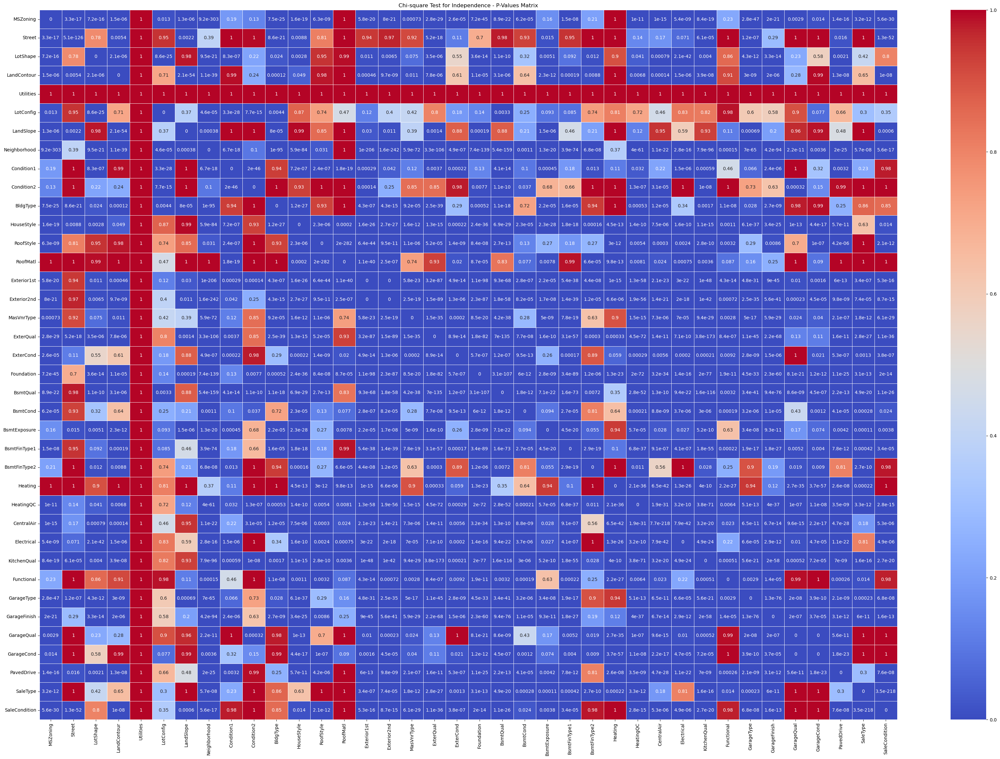

In [40]:
plt.figure(figsize=(42,28))
sns.heatmap(p_values.astype(float), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Chi-square Test for Independence - P-Values Matrix')
plt.show()

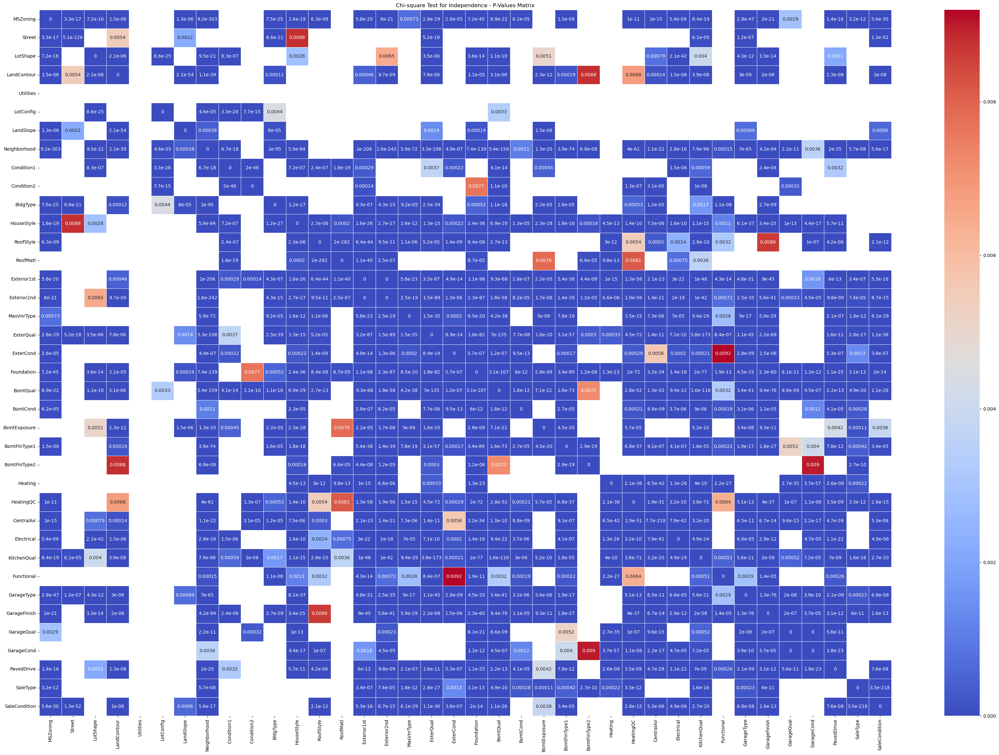

In [41]:
plt.figure(figsize=(42,28))
p1 = p_values[p_values.abs() < 0.01].astype(float)
sns.heatmap(p1, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Chi-square Test for Independence - P-Values Matrix')
plt.show()


### ANOVA Testing between the categorical variable and target variable

In [42]:
from scipy.stats import f_oneway
col_n = {}
f_stat = {} 
p_value = {}
i=1

for column in cat_cols.columns:
    f_stat[i], p_value[i] = f_oneway(*[combined_df[combined_df[column] == category]['SalePrice'] for category in combined_df[column].unique()])
    col_n[i]=column
    i=i+1

df1 = pd.DataFrame({'Column_name':col_n,'f_stats_value':f_stat,'p_value':p_value})
#df1

most_significant_variable = df1.sort_values(by='p_value')['Column_name']
p_val = df1.sort_values(by='p_value')['p_value']

df0=pd.DataFrame({'Column_name':most_significant_variable,'p_value':p_val})
df0

,Column_name,p_value
8,Neighborhood,1.558600e-225
18,ExterQual,1.439551e-204
21,BsmtQual,2.078120e-194
30,KitchenQual,3.032213e-192
33,GarageFinish,5.993319e-111
20,Foundation,5.791895e-91
27,HeatingQC,2.667062e-67
24,BsmtFinType1,3.598398e-66
17,MasVnrType,1.279704e-63
32,GarageType,2.578443e-56


In [43]:
combined_df = pd.concat([nume_cols,cat_cols],axis=1)


## Feature selection for the categorical variables

In [44]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder

df = combined_df
label_encoder = LabelEncoder()
for column in cat_colnames:
    df[column] = label_encoder.fit_transform(combined_df[column])

In [45]:
rf = RandomForestRegressor()
selector = SelectFromModel(rf, max_features=len(cat_colnames))
selector.fit(df[cat_colnames], df['SalePrice'])
selected_features = df[cat_colnames].columns[selector.get_support()]

print("Selected Features:", selected_features)

Selected Features: Index(['MSZoning', 'Neighborhood', 'HouseStyle', 'ExterQual', 'BsmtQual',
       'KitchenQual', 'GarageFinish'],
      dtype='object')


In [46]:
# Selected Features: Index(['Neighborhood', 'ExterQual', 'BsmtQual', 'KitchenQual', 'GarageFinish'], dtype='object')


# Selected Features: Index(['OverallQual', 'BsmtFinSF1', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',  'GrLivArea', 'GarageCars', 'GarageArea']

In [47]:
# Assuming 'target_variable' is the target variable for classification
X = combined_df[cat_colnames]
y = df['SalePrice']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit a RandomForestRegressor
rf_classifier = RandomForestRegressor(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [48]:
# Get feature importances
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame with feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Display feature importances
print("Feature Importances:")
feature_importance_df.sort_values(by='Importance',ascending=False)[0:50]


Feature Importances:


,Feature,Importance
17,ExterQual,0.405896
20,BsmtQual,0.118174
32,GarageFinish,0.057432
7,Neighborhood,0.053192
29,KitchenQual,0.049014
11,HouseStyle,0.035201
0,MSZoning,0.026779
31,GarageType,0.026566
10,BldgType,0.024596
16,MasVnrType,0.021872


In [49]:
# Select features with importance greater than a threshold (adjust as needed)
selected_features = feature_importance_df[feature_importance_df['Importance'] > 0.01]['Feature']
print("\nSelected Features:")
print(selected_features)


Selected Features:
0         MSZoning
2         LotShape
5        LotConfig
7     Neighborhood
10        BldgType
11      HouseStyle
12       RoofStyle
14     Exterior1st
15     Exterior2nd
16      MasVnrType
17       ExterQual
20        BsmtQual
22    BsmtExposure
23    BsmtFinType1
27      CentralAir
29     KitchenQual
31      GarageType
32    GarageFinish
Name: Feature, dtype: object


Selected Features:
- MSZoning
- LotShape
- LotConfig
- Neighborhood
- BldgType
- HouseStyle
- RoofStyle
- Exterior1st
- Exterior2nd
- sVnrType
- ExterQual
- ExterCond
- BsmtQual
- BsmtExposure
- BsmtFinType1
- CentralAir
- KitchenQual
- GarageType
- GarageFinish


In [50]:
combined_df[num_colnames].head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,0,61,0,0,0,0,0,2,2008,208500
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,...,0,42,0,0,0,0,0,9,2008,223500
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,...,192,84,0,0,0,0,0,12,2008,250000
6,20,75.0,10084,8,5,2004,2005,186.0,1369,0,...,255,57,0,0,0,0,0,8,2007,307000
10,20,70.0,11200,5,5,1965,1965,0.0,906,0,...,0,0,0,0,0,0,0,2,2008,129500


### Correlation plot for continous variable

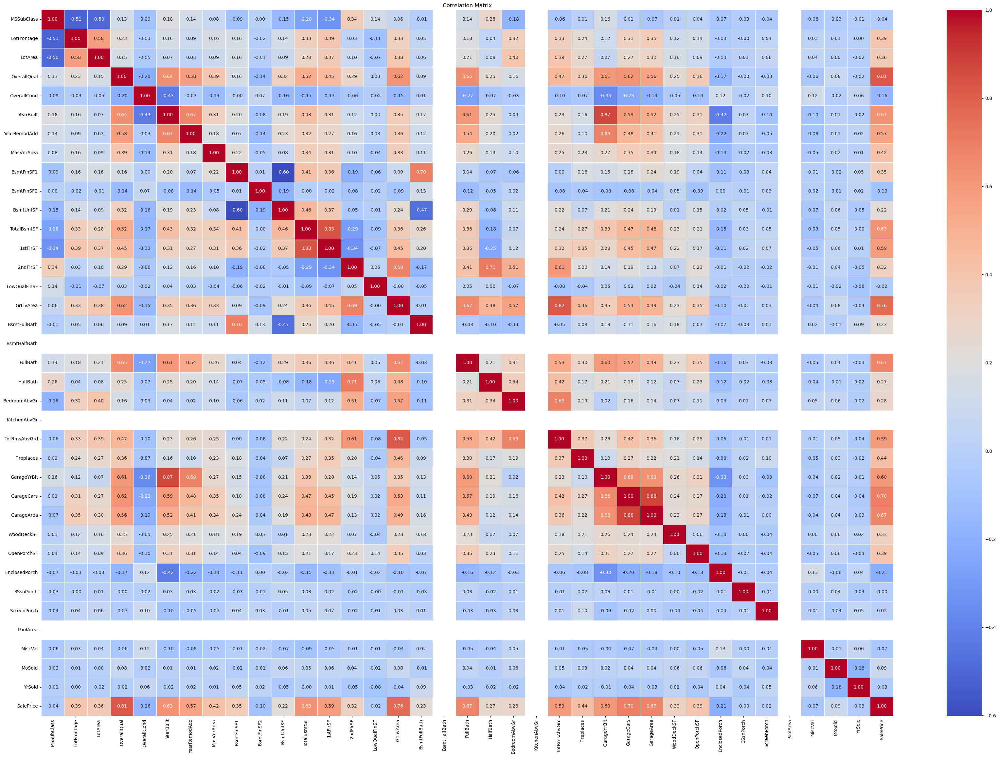

In [51]:
correlation_matrix = combined_df[num_colnames].corr()
plt.figure(figsize=(42, 28))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

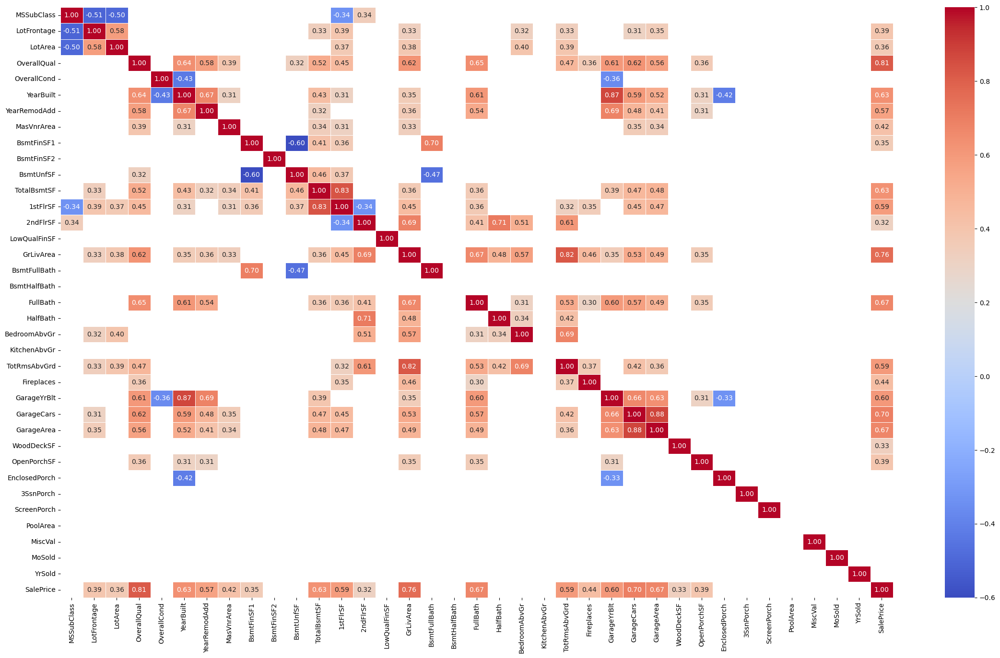

In [52]:
# Assuming combined_df is your DataFrame and num_colnames is a list of numerical column names
correlation_matrix = combined_df[nume_cols.columns].corr()

# Filter the correlation matrix to include only values greater than 0.3
high_corr_matrix = correlation_matrix[correlation_matrix.abs() > 0.3]

# Create a heatmap
plt.figure(figsize=(28, 16))
sns.heatmap(high_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

plt.show()
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Loop through each column in 'cat_cols' and apply label encoding
for col in cat_cols.columns:
    cat_cols[col] = label_encoder.fit_transform(cat_cols[col])

## Removed three more columns from the Dataset

In [53]:
out_col =['BsmtHalfBath','PoolArea','KitchenAbvGr']

nume_cols = nume_cols.drop(columns=out_col,axis=1)


In [54]:
nume_cols.columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

## Feature selection for the continous variables

In [55]:
from sklearn.linear_model import LassoCV, RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import numpy as np
X = combined_df[nume_cols.columns].drop('SalePrice', axis=1)
y = combined_df['SalePrice']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [56]:
# Lasso Regression
lasso_model = LassoCV(alphas=np.logspace(-4, 4, 100), cv=10, random_state=42)
lasso_model.fit(X_train_scaled, y_train)

LassoCV(alphas=array([1.00000000e-04, 1.20450354e-04, 1.45082878e-04, 1.74752840e-04,
       2.10490414e-04, 2.53536449e-04, 3.05385551e-04, 3.67837977e-04,
       4.43062146e-04, 5.33669923e-04, 6.42807312e-04, 7.74263683e-04,
       9.32603347e-04, 1.12332403e-03, 1.35304777e-03, 1.62975083e-03,
       1.96304065e-03, 2.36448941e-03, 2.84803587e-03, 3.43046929e-03,
       4.13201240e-03, 4.97702356e-0...
       1.38488637e+02, 1.66810054e+02, 2.00923300e+02, 2.42012826e+02,
       2.91505306e+02, 3.51119173e+02, 4.22924287e+02, 5.09413801e+02,
       6.13590727e+02, 7.39072203e+02, 8.90215085e+02, 1.07226722e+03,
       1.29154967e+03, 1.55567614e+03, 1.87381742e+03, 2.25701972e+03,
       2.71858824e+03, 3.27454916e+03, 3.94420606e+03, 4.75081016e+03,
       5.72236766e+03, 6.89261210e+03, 8.30217568e+03, 1.00000000e+04]),
        cv=10, random_state=42)

In [57]:
# Ridge Regression
ridge_model = RidgeCV(alphas=np.logspace(-4, 4, 100), cv=10)
ridge_model.fit(X_train_scaled, y_train)

RidgeCV(alphas=array([1.00000000e-04, 1.20450354e-04, 1.45082878e-04, 1.74752840e-04,
       2.10490414e-04, 2.53536449e-04, 3.05385551e-04, 3.67837977e-04,
       4.43062146e-04, 5.33669923e-04, 6.42807312e-04, 7.74263683e-04,
       9.32603347e-04, 1.12332403e-03, 1.35304777e-03, 1.62975083e-03,
       1.96304065e-03, 2.36448941e-03, 2.84803587e-03, 3.43046929e-03,
       4.13201240e-03, 4.97702356e-0...
       1.38488637e+02, 1.66810054e+02, 2.00923300e+02, 2.42012826e+02,
       2.91505306e+02, 3.51119173e+02, 4.22924287e+02, 5.09413801e+02,
       6.13590727e+02, 7.39072203e+02, 8.90215085e+02, 1.07226722e+03,
       1.29154967e+03, 1.55567614e+03, 1.87381742e+03, 2.25701972e+03,
       2.71858824e+03, 3.27454916e+03, 3.94420606e+03, 4.75081016e+03,
       5.72236766e+03, 6.89261210e+03, 8.30217568e+03, 1.00000000e+04]),
        cv=10)

In [58]:
# Function to evaluate model performance using R2 and adjusted R2
def evaluate_model(model, X, y):
    y_pred = model.predict(X)
    r2 = r2_score(y, y_pred)
    #adj_r2 = adj_r2_score(y, y_pred, X.shape[1])
    return r2


In [59]:
# Evaluate Lasso model
lasso_r2 = evaluate_model(lasso_model, X_test_scaled, y_test)

# Evaluate Ridge model
ridge_r2 = evaluate_model(ridge_model, X_test_scaled, y_test)

# Print results
print("Lasso Regression:")
lasso_feature = X.columns[lasso_model.coef_ != 0]
print("Selected Features:", lasso_feature)
print("Best alpha:", lasso_model.alpha_)
print("R-squared (R2):", lasso_r2)

print("\nRidge Regression:")
ridge_feature = X.columns[ridge_model.coef_ != 0]
print("Selected Features:", ridge_feature)
print("Best alpha:", ridge_model.alpha_)
print("R-squared (R2):", ridge_r2)

Lasso Regression:
Selected Features: Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'TotalBsmtSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'HalfBath', 'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', 'ScreenPorch', 'MiscVal', 'MoSold', 'YrSold'],
      dtype='object')
Best alpha: 65.79332246575683
R-squared (R2): 0.8784414283865694

Ridge Regression:
Selected Features: Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea',
   

In [60]:
fn_df3 = pd.concat([cat_cols,nume_cols],axis=1)
fn_df4 = pd.concat([cat_cols,nume_cols],axis=1)

In [61]:
fn_df3

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SalePrice
0,3,1,3,3,0,4,0,5,2,1,...,548,0,61,0,0,0,0,2,2008,208500
2,3,1,0,3,0,4,0,5,2,1,...,608,0,42,0,0,0,0,9,2008,223500
4,3,1,0,3,0,2,0,15,2,1,...,836,192,84,0,0,0,0,12,2008,250000
6,3,1,3,3,0,4,0,21,2,1,...,636,255,57,0,0,0,0,8,2007,307000
10,3,1,3,3,0,4,0,19,2,1,...,384,0,0,0,0,0,0,2,2008,129500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,4,1,3,3,0,4,0,7,2,1,...,525,0,28,0,0,0,0,5,2006,145000
1453,3,1,3,3,0,4,0,11,2,1,...,0,36,56,0,0,0,0,7,2006,84500
1454,1,1,3,3,0,4,0,21,2,1,...,400,0,113,0,0,0,0,10,2009,185000
1455,3,1,3,3,0,4,0,8,2,1,...,460,0,40,0,0,0,0,8,2007,175000


'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'TotalBsmtSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'HalfBath', 'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', 'ScreenPorch', 'MiscVal', 'MoSold', 'YrSold'

### Now we have handled the missing values in cat_cols and we are good to go ahead and convert the cat_cols to numericals using LabelEncoder.

In [62]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Loop through each column in 'cat_cols' and apply label encoding
for col in cat_cols.columns:
    cat_cols[col] = label_encoder.fit_transform(cat_cols[col])

In [63]:
combined_df = pd.concat([cat_cols,nume_cols],axis=1)
fn_df = pd.concat([cat_cols,nume_cols],axis=1)
fn_df1 = pd.concat([cat_cols,nume_cols],axis=1)


In [64]:
fn_df3

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SalePrice
0,3,1,3,3,0,4,0,5,2,1,...,548,0,61,0,0,0,0,2,2008,208500
2,3,1,0,3,0,4,0,5,2,1,...,608,0,42,0,0,0,0,9,2008,223500
4,3,1,0,3,0,2,0,15,2,1,...,836,192,84,0,0,0,0,12,2008,250000
6,3,1,3,3,0,4,0,21,2,1,...,636,255,57,0,0,0,0,8,2007,307000
10,3,1,3,3,0,4,0,19,2,1,...,384,0,0,0,0,0,0,2,2008,129500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,4,1,3,3,0,4,0,7,2,1,...,525,0,28,0,0,0,0,5,2006,145000
1453,3,1,3,3,0,4,0,11,2,1,...,0,36,56,0,0,0,0,7,2006,84500
1454,1,1,3,3,0,4,0,21,2,1,...,400,0,113,0,0,0,0,10,2009,185000
1455,3,1,3,3,0,4,0,8,2,1,...,460,0,40,0,0,0,0,8,2007,175000


In [65]:
combined_df.shape

(1015, 72)

In [66]:
num_col = nume_cols.select_dtypes(include=['number']).columns
cat_col = cat_cols.select_dtypes(exclude=['number']).columns
num_col,cat_col

(Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
        'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
        'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
        'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
        'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea',
        'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
        'ScreenPorch', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
       dtype='object'),
 Index([], dtype='object'))

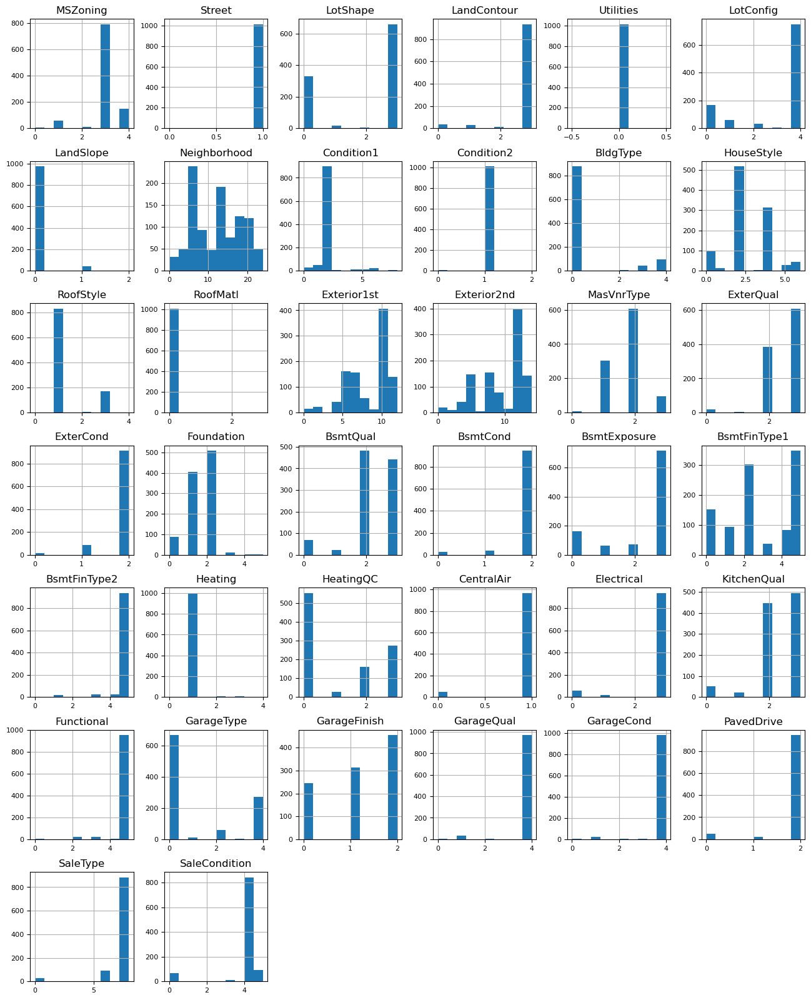

In [67]:
cat_cols.hist(figsize=(16, 20),  xlabelsize=8, ylabelsize=8);

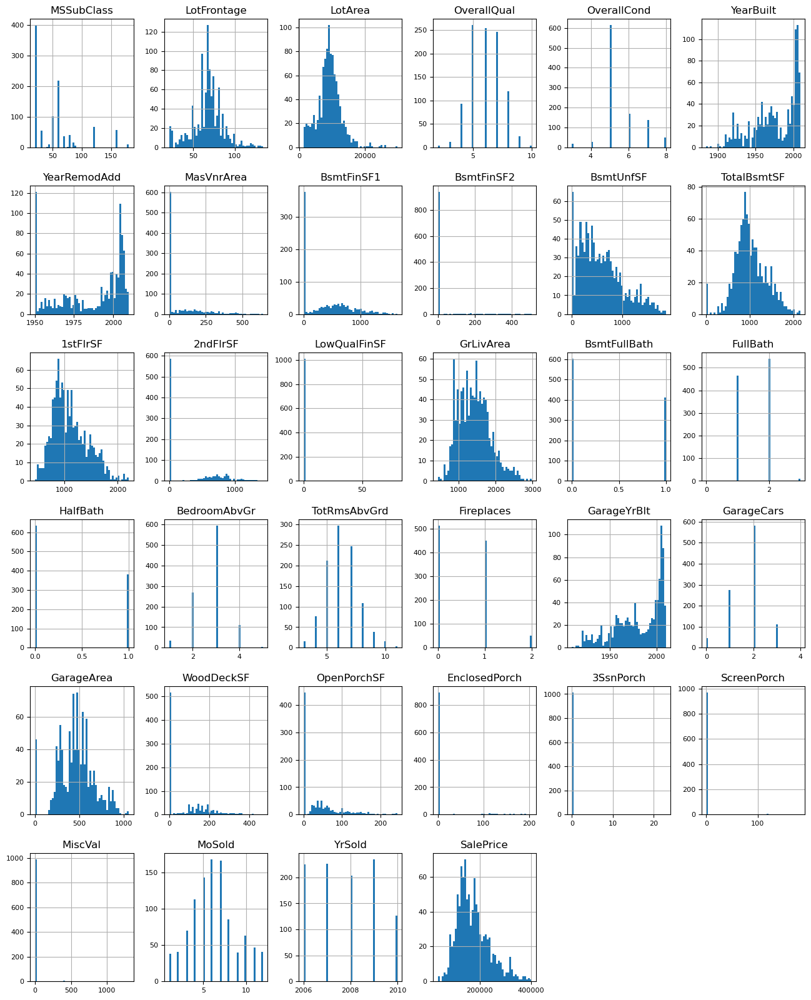

In [68]:
nume_cols.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

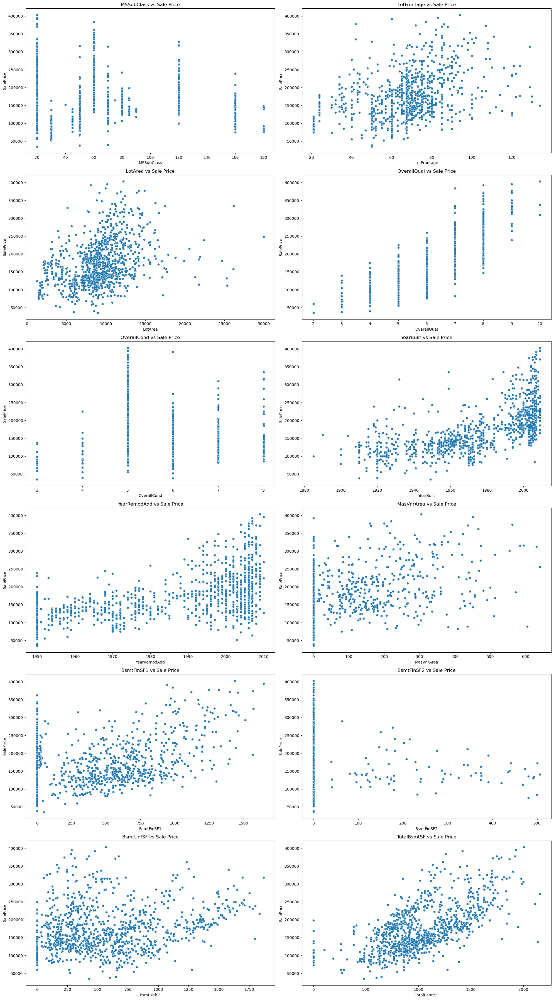

In [69]:
num_rows = 6
num_cols = 2
# Create a 7x7 grid of subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 36))
axes=axes.flatten()
for i,num in enumerate(nume_cols.columns[:12]):
    sns.scatterplot(x=num, y='SalePrice', data=combined_df,ax=axes[i])
    axes[i].set_title('{} vs Sale Price'.format(num))
plt.tight_layout()
plt.show()

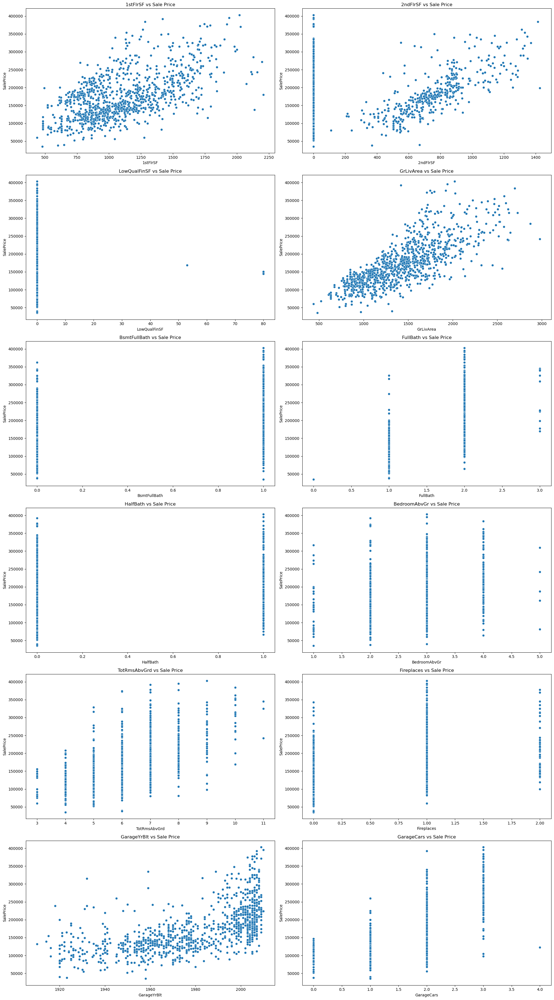

In [70]:
num_rows = 6
num_cols = 2
# Create a 7x7 grid of subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 36))
axes=axes.flatten()
for i,num in enumerate(nume_cols.columns[12:24]):
    sns.scatterplot(x=num, y='SalePrice', data=combined_df,ax=axes[i])
    axes[i].set_title('{} vs Sale Price'.format(num))
plt.tight_layout()
plt.show()

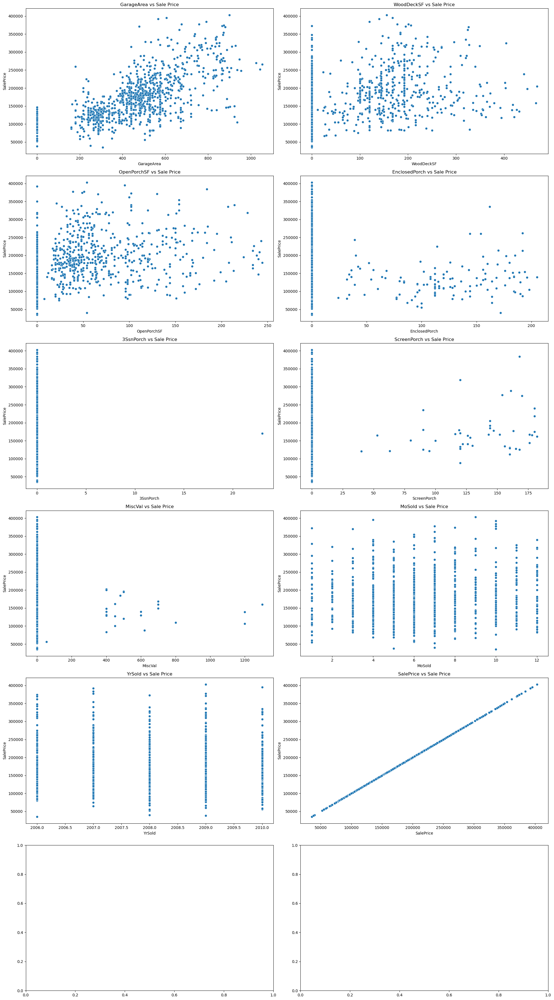

In [71]:
num_rows = 6
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 36))
axes=axes.flatten()
for i,num in enumerate(nume_cols.columns[24:36]):
    sns.scatterplot(x=num, y='SalePrice', data=combined_df,ax=axes[i])
    axes[i].set_title('{} vs Sale Price'.format(num))
plt.tight_layout()
plt.show()

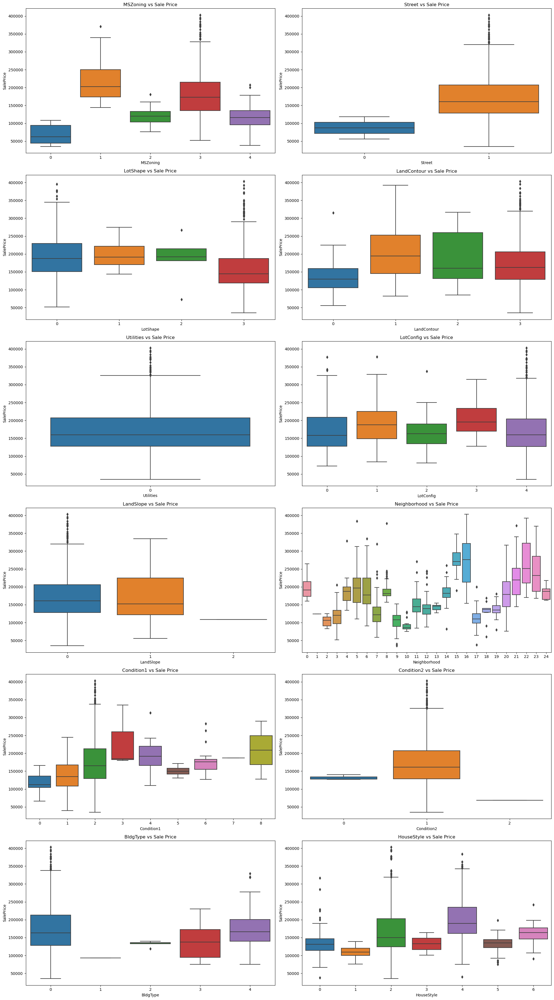

In [72]:
num_rows = 6
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 36))
axes=axes.flatten()
for i,cat in enumerate(cat_colnames[:12]):
    sns.boxplot(x=cat, y='SalePrice', data=combined_df,ax=axes[i])
    axes[i].set_title('{} vs Sale Price'.format(cat))
plt.tight_layout()
plt.show()

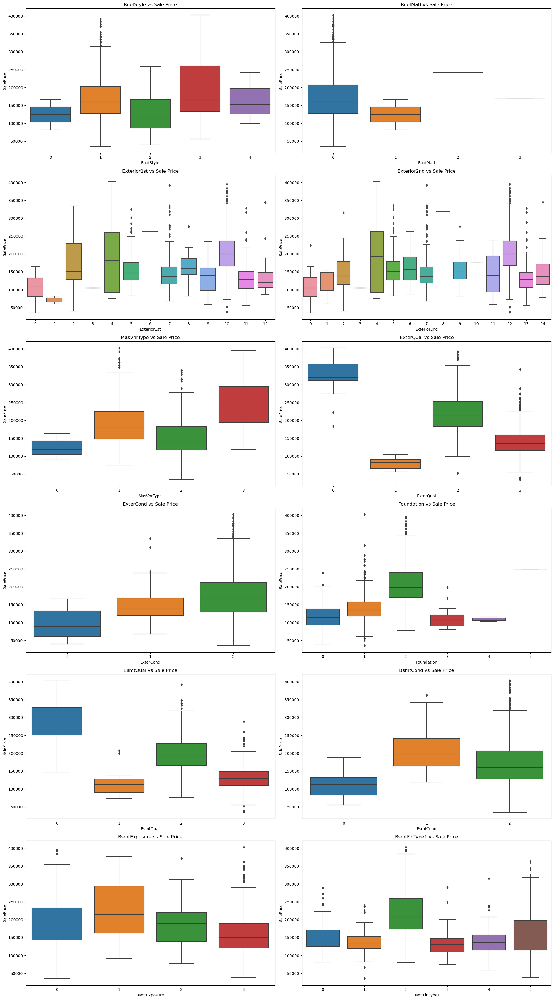

In [73]:
num_rows = 6
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 36))
axes=axes.flatten()
for i,cat in enumerate(cat_colnames[12:24]):
    sns.boxplot(x=cat, y='SalePrice', data=combined_df,ax=axes[i])
    axes[i].set_title('{} vs Sale Price'.format(cat))
plt.tight_layout()
plt.show()

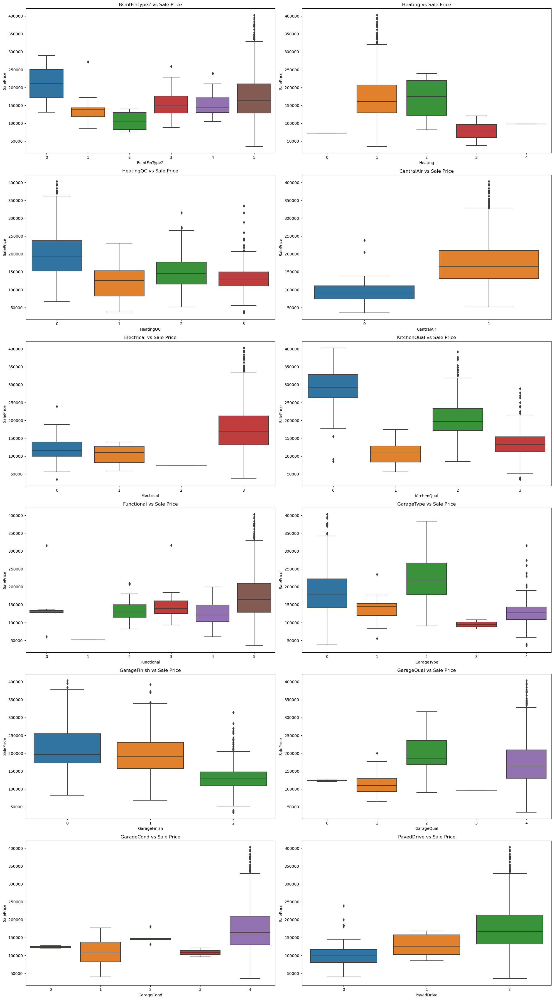

In [74]:
num_rows = 6
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 36))
axes=axes.flatten()
for i,cat in enumerate(cat_colnames[24:36]):
    sns.boxplot(x=cat, y='SalePrice', data=combined_df,ax=axes[i])
    axes[i].set_title('{} vs Sale Price'.format(cat))
plt.tight_layout()
plt.show()

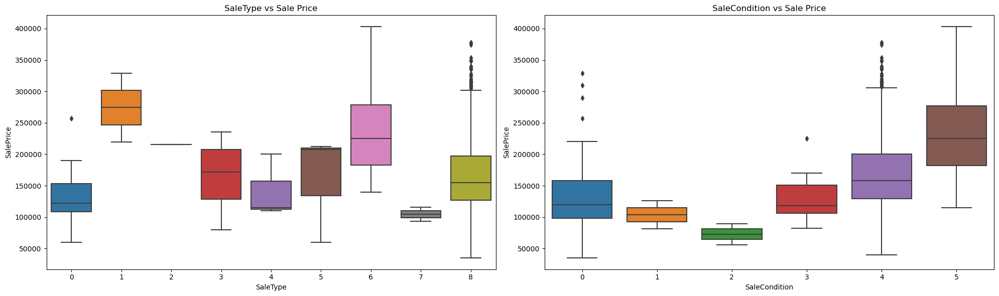

In [75]:
num_rows = 1
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 6))
axes=axes.flatten()
for i,cat in enumerate(cat_colnames[36:]):
    sns.boxplot(x=cat, y='SalePrice', data=combined_df,ax=axes[i])
    axes[i].set_title('{} vs Sale Price'.format(cat))
plt.tight_layout()
plt.show()

In [76]:
lasso_feature

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'TotalBsmtSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'HalfBath', 'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', 'ScreenPorch', 'MiscVal', 'MoSold', 'YrSold'],
      dtype='object')

In [77]:
f_feature = lasso_feature.to_list() + selected_features.to_list()
f_feature.append('SalePrice')
print(len(f_feature))
f_feature

48


['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'TotalBsmtSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'HalfBath',
 'BedroomAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 'ScreenPorch',
 'MiscVal',
 'MoSold',
 'YrSold',
 'MSZoning',
 'LotShape',
 'LotConfig',
 'Neighborhood',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'BsmtQual',
 'BsmtExposure',
 'BsmtFinType1',
 'CentralAir',
 'KitchenQual',
 'GarageType',
 'GarageFinish',
 'SalePrice']

In [78]:
fn_df3

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SalePrice
0,3,1,3,3,0,4,0,5,2,1,...,548,0,61,0,0,0,0,2,2008,208500
2,3,1,0,3,0,4,0,5,2,1,...,608,0,42,0,0,0,0,9,2008,223500
4,3,1,0,3,0,2,0,15,2,1,...,836,192,84,0,0,0,0,12,2008,250000
6,3,1,3,3,0,4,0,21,2,1,...,636,255,57,0,0,0,0,8,2007,307000
10,3,1,3,3,0,4,0,19,2,1,...,384,0,0,0,0,0,0,2,2008,129500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,4,1,3,3,0,4,0,7,2,1,...,525,0,28,0,0,0,0,5,2006,145000
1453,3,1,3,3,0,4,0,11,2,1,...,0,36,56,0,0,0,0,7,2006,84500
1454,1,1,3,3,0,4,0,21,2,1,...,400,0,113,0,0,0,0,10,2009,185000
1455,3,1,3,3,0,4,0,8,2,1,...,460,0,40,0,0,0,0,8,2007,175000


### Spliting the Data

In [79]:
from sklearn.model_selection import train_test_split
import numpy as np
# Separate the target variable and the features
X = combined_df[f_feature].drop(columns=['SalePrice'])  
y = combined_df['SalePrice']

In [80]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [81]:
n = X_test.shape[0]  
p = X_test.shape[1] 
n,p

(203, 47)

In [82]:
X_train.shape

(812, 47)

## Linear regression

In [83]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score, KFold, train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, make_scorer, r2_score
import numpy as np
import pandas as pd


In [84]:
# Create and fit a linear regression model
lm_model = LinearRegression()


In [85]:
# Define the number of folds for cross-validation
num_folds = 5

# Define the KFold cross-validator
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Define custom scorer for R-squared (since cross_val_score returns negated values)
r2_scorer = make_scorer(r2_score)

# Calculate MSE, RMSE, R-squared, and Adjusted R-squared using k-fold cross-validation
mse_scores = -cross_val_score(lm_model, X, y, cv=kf, scoring='neg_mean_squared_error')
rmse_scores = np.sqrt(mse_scores)
r2_scores = cross_val_score(lm_model, X, y, cv=kf, scoring=r2_scorer)
adj_r2_scores = []

for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    model = LinearRegression().fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    n = X_test.shape[0]
    p = X_test.shape[1]
    
    adj_r2 = 1 - ((1 - r2_score(y_test, y_pred)) * (n - 1) / (n - p - 1))
    adj_r2_scores.append(adj_r2)

    # Calculate the average scores
average_mse = np.mean(mse_scores)
average_rmse = np.mean(rmse_scores)
average_r2 = np.mean(r2_scores)
average_adj_r2 = np.mean(adj_r2_scores)

print("\nAverage Mean Squared Error (MSE):", average_mse)
print("Average Root Mean Squared Error (RMSE):", average_rmse)
print("Average R-squared (R2):", average_r2)
print("Average Adjusted R-squared (Adj R2):", average_adj_r2)


Average Mean Squared Error (MSE): 420650937.9779725
Average Root Mean Squared Error (RMSE): 20457.410527271706
Average R-squared (R2): 0.8941244079883246
Average Adjusted R-squared (Adj R2): 0.8620201962170423


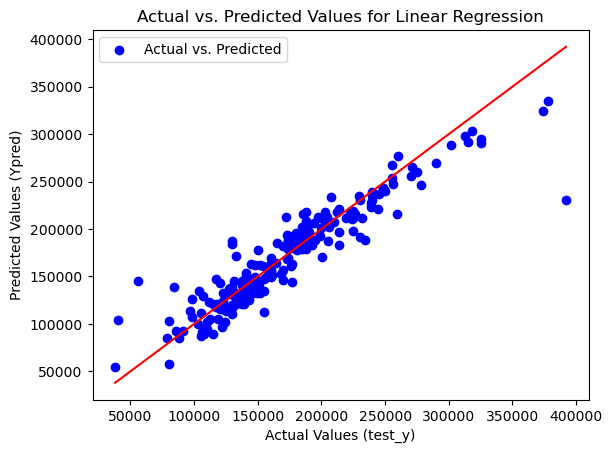

In [86]:
plt.scatter(y_test, y_pred, color='blue', label='Actual vs. Predicted')

# Plotting the diagonal line (abline(0,1))
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red')

# Adding labels and title
plt.xlabel('Actual Values (test_y)')
plt.ylabel('Predicted Values (Ypred)')
plt.title('Actual vs. Predicted Values for Linear Regression')

# Displaying the legend
plt.legend()

# Show the plot
plt.show()

In [87]:
mse = []
rmse = []
r2 = []
adj_r2_m = []


In [88]:
mse.append(average_mse)
rmse.append(average_rmse)
r2.append(average_r2)
adj_r2_m.append(average_adj_r2)

In [89]:
mse, rmse, r2, adj_r2_m


([420650937.9779725],
 [20457.410527271706],
 [0.8941244079883246],
 [0.8620201962170423])

# Random Forest

In [90]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

In [91]:
param_grid = {
    'n_estimators': [10, 50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

In [92]:
# Create and fit a Random Forest regression model
rf_model = RandomForestRegressor(random_state=42)


In [93]:
# Perform Grid Search with cross-validation
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Fit the model to find the best hyperparameters
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding accuracy score
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("Best Hyperparameters:", best_params)
print("Best Accuracy Score:", best_score)

# Evaluate the model on the test data with the best hyperparameters
best_rf_classifier = grid_search.best_estimator_
test_accuracy = best_rf_classifier.score(X_test, y_test)
print("Test Accuracy with Best Hyperparameters:", test_accuracy)

Fitting 5 folds for each of 288 candidates, totalling 1440 fits
Best Hyperparameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best Accuracy Score: 0.8948028909301208
Test Accuracy with Best Hyperparameters: 0.8582799439618713


In [94]:
rf_model_bm = RandomForestRegressor(**best_params,random_state=42)

In [95]:
# Define the number of folds for cross-validation
num_folds = 5

# Define the KFold cross-validator
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Define custom scorer for R-squared (since cross_val_score returns negated values)
r2_scorer = make_scorer(r2_score)

# Calculate MSE, RMSE, R-squared, and Adjusted R-squared using k-fold cross-validation
mse_scores = -cross_val_score(rf_model_bm, X, y, cv=kf, scoring='neg_mean_squared_error')
rmse_scores = np.sqrt(mse_scores)
r2_scores = cross_val_score(rf_model_bm, X, y, cv=kf, scoring=r2_scorer)
adj_r2_scores = []

for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    model = RandomForestRegressor(**best_params,random_state=42).fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    n = X_test.shape[0]
    p = X_test.shape[1]
    
    adj_r2 = 1 - ((1 - r2_score(y_test, y_pred)) * (n - 1) / (n - p - 1))
    adj_r2_scores.append(adj_r2)

    # Calculate the average scores
average_mse = np.mean(mse_scores)
average_rmse = np.mean(rmse_scores)
average_r2 = np.mean(r2_scores)
average_adj_r2 = np.mean(adj_r2_scores)

print("Average Mean Squared Error (MSE):", average_mse)
print("Average Root Mean Squared Error (RMSE):", average_rmse)
print("Average R-squared (R2):", average_r2)
print("Average Adjusted R-squared (Adj R2):", average_adj_r2)

Average Mean Squared Error (MSE): 453098548.05749834
Average Root Mean Squared Error (RMSE): 21114.035162434848
Average R-squared (R2): 0.8874028322004393
Average Adjusted R-squared (Adj R2): 0.8532604651902498


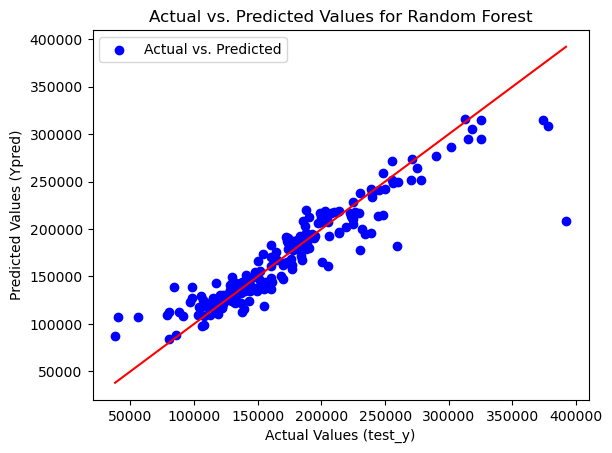

In [96]:
plt.scatter(y_test, y_pred, color='blue', label='Actual vs. Predicted')

# Plotting the diagonal line (abline(0,1))
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red')

# Adding labels and title
plt.xlabel('Actual Values (test_y)')
plt.ylabel('Predicted Values (Ypred)')
plt.title('Actual vs. Predicted Values for Random Forest')

# Displaying the legend
plt.legend()

# Show the plot
plt.show()

In [97]:
mse.append(average_mse)
rmse.append(average_rmse)
r2.append(average_r2)
adj_r2_m.append(average_adj_r2)

In [98]:
type(r2)

list

# Gradient boosting Regression

In [99]:
from sklearn.ensemble import GradientBoostingRegressor

In [100]:
# Create and fit a Gradient Boosting regression model
gb_model = GradientBoostingRegressor(random_state=42)


In [101]:
param_grid = {
    'n_estimators': [20,40,50,60,80,100],
    'max_depth': [None, 3, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4, 6],
    'max_features': ['sqrt', 'log2']
}

In [102]:
# Perform Grid Search with cross-validation
grid_search = GridSearchCV(estimator=gb_model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Fit the model to find the best hyperparameters
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding accuracy score
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("Best Hyperparameters:", best_params)
print("Best Accuracy Score:", best_score)

# Evaluate the model on the test data with the best hyperparameters
best_rf_classifier = grid_search.best_estimator_
test_accuracy = best_rf_classifier.score(X_test, y_test)
print("Test Accuracy with Best Hyperparameters:", test_accuracy)

Fitting 5 folds for each of 576 candidates, totalling 2880 fits
Best Hyperparameters: {'max_depth': 3, 'max_features': 'log2', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
Best Accuracy Score: 0.9025931690971023
Test Accuracy with Best Hyperparameters: 0.8682312998086856


In [103]:
##Best model
gb_model = GradientBoostingRegressor(**best_params,random_state=42)

In [104]:
# Define the number of folds for cross-validation
num_folds = 5

# Define the KFold cross-validator
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Define custom scorer for R-squared (since cross_val_score returns negated values)
r2_scorer = make_scorer(r2_score)

# Calculate MSE, RMSE, R-squared, and Adjusted R-squared using k-fold cross-validation
mse_scores = -cross_val_score(gb_model, X, y, cv=kf, scoring='neg_mean_squared_error')
rmse_scores = np.sqrt(mse_scores)
r2_scores = cross_val_score(gb_model, X, y, cv=kf, scoring=r2_scorer)
adj_r2_scores = []

for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    model = GradientBoostingRegressor(**best_params,random_state=42).fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    n = X_test.shape[0]
    p = X_test.shape[1]
    
    adj_r2 = 1 - ((1 - r2_score(y_test, y_pred)) * (n - 1) / (n - p - 1))
    adj_r2_scores.append(adj_r2)

    # Calculate the average scores
average_mse = np.mean(mse_scores)
average_rmse = np.mean(rmse_scores)
average_r2 = np.mean(r2_scores)
average_adj_r2 = np.mean(adj_r2_scores)

print("\nAverage Mean Squared Error (MSE):", average_mse)
print("Average Root Mean Squared Error (RMSE):", average_rmse)
print("Average R-squared (R2):", average_r2)
print("Average Adjusted R-squared (Adj R2):", average_adj_r2)


Average Mean Squared Error (MSE): 409451395.1456501
Average Root Mean Squared Error (RMSE): 20166.833922586626
Average R-squared (R2): 0.8974315595716839
Average Adjusted R-squared (Adj R2): 0.8663301615063235


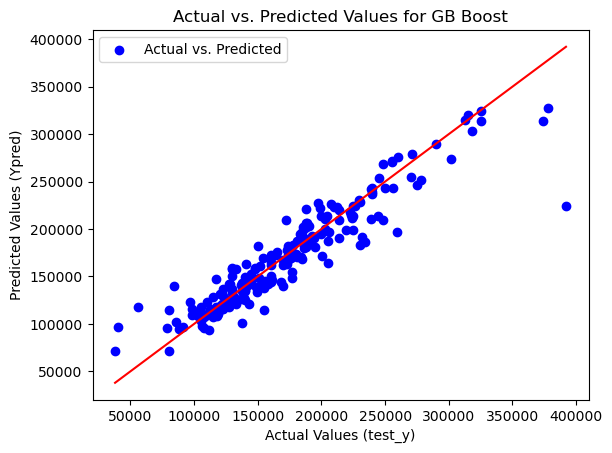

In [105]:
plt.scatter(y_test, y_pred, color='blue', label='Actual vs. Predicted')

# Plotting the diagonal line (abline(0,1))
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red')

# Adding labels and title
plt.xlabel('Actual Values (test_y)')
plt.ylabel('Predicted Values (Ypred)')
plt.title('Actual vs. Predicted Values for GB Boost')

# Displaying the legend
plt.legend()

# Show the plot
plt.show()

In [106]:
mse.append(average_mse)
rmse.append(average_rmse)
r2.append(average_r2)
adj_r2_m.append(average_adj_r2)

# XG Boost

In [107]:
#pip install xgboost

In [108]:
import xgboost as xgb

In [109]:
xgb_model = xgb.XGBRegressor(random_state=42)


In [110]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
}

In [111]:
# Perform Grid Search with cross-validation
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid,  scoring='neg_mean_squared_error',cv=5)

# Fit the model to find the best hyperparameters
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding accuracy score
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("Best Hyperparameters:", best_params)
print("Best Accuracy Score:", best_score)

# Evaluate the model on the test data with the best hyperparameters
best_rf_classifier = grid_search.best_estimator_
test_accuracy = best_rf_classifier.score(X_test, y_test)
print("Test Accuracy with Best Hyperparameters:", test_accuracy)


Best Hyperparameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
Best Accuracy Score: -385726568.5538347
Test Accuracy with Best Hyperparameters: 0.8741734465410008


In [112]:
xgb_model = xgb.XGBRegressor(**best_params,random_state=42)


In [113]:
# Define the number of folds for cross-validation
num_folds = 5

# Define the KFold cross-validator
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Define custom scorer for R-squared (since cross_val_score returns negated values)
r2_scorer = make_scorer(r2_score)

# Calculate MSE, RMSE, R-squared, and Adjusted R-squared using k-fold cross-validation
mse_scores = -cross_val_score(xgb_model, X, y, cv=kf, scoring='neg_mean_squared_error')
rmse_scores = np.sqrt(mse_scores)
r2_scores = cross_val_score(xgb_model, X, y, cv=kf, scoring=r2_scorer)
adj_r2_scores = []

for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    model = xgb.XGBRegressor( **best_params,random_state=42).fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    n = X_test.shape[0]
    p = X_test.shape[1]
    
    adj_r2 = 1 - ((1 - r2_score(y_test, y_pred)) * (n - 1) / (n - p - 1))
    adj_r2_scores.append(adj_r2)

    # Calculate the average scores
average_mse = np.mean(mse_scores)
average_rmse = np.mean(rmse_scores)
average_r2 = np.mean(r2_scores)
average_adj_r2 = np.mean(adj_r2_scores)

print("\nAverage Mean Squared Error (MSE):", average_mse)
print("Average Root Mean Squared Error (RMSE):", average_rmse)
print("Average R-squared (R2):", average_r2)
print("Average Adjusted R-squared (Adj R2):", average_adj_r2)


Average Mean Squared Error (MSE): 395455793.7554444
Average Root Mean Squared Error (RMSE): 19836.044545360783
Average R-squared (R2): 0.9006649434338568
Average Adjusted R-squared (Adj R2): 0.8705439907976716


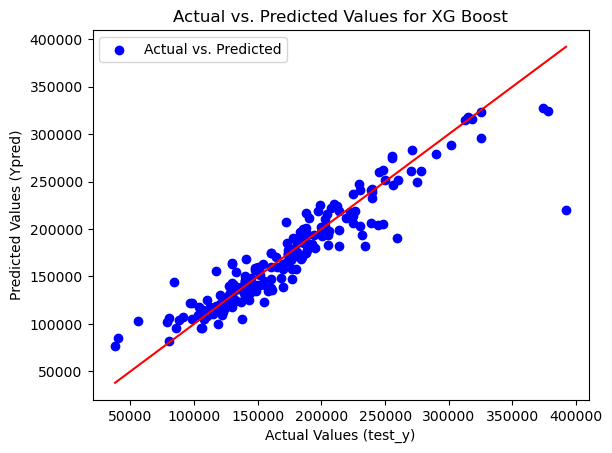

In [114]:
plt.scatter(y_test, y_pred, color='blue', label='Actual vs. Predicted')

# Plotting the diagonal line (abline(0,1))
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red')

# Adding labels and title
plt.xlabel('Actual Values (test_y)')
plt.ylabel('Predicted Values (Ypred)')
plt.title('Actual vs. Predicted Values for XG Boost')

# Displaying the legend
plt.legend()

# Show the plot
plt.show()

In [115]:
mse.append(average_mse)
rmse.append(average_rmse)
r2.append(average_r2)
adj_r2_m.append(average_adj_r2)

# catboost

In [116]:
#pip install catboost

In [117]:
from catboost import CatBoostRegressor

In [118]:
catboost_model = CatBoostRegressor( random_seed=42, verbose=0)

In [119]:
param_grid = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [4, 6, 8],
    'l2_leaf_reg': [1, 3, 5],
    'border_count': [32, 64, 128],
}

In [120]:
# Perform Grid Search with cross-validation
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid,  scoring='neg_mean_squared_error',cv=5,n_jobs=-1)

# Fit the model to find the best hyperparameters
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding accuracy score
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("Best Hyperparameters:", best_params)
print("Best Accuracy Score:", best_score)

# Evaluate the model on the test data with the best hyperparameters
best_rf_classifier = grid_search.best_estimator_
test_accuracy = best_rf_classifier.score(X_test, y_test)
print("Test Accuracy with Best Hyperparameters:", test_accuracy)


C:\Users\choun\AppData\Roaming\Python\Python310\site-packages\xgboost\core.py:160: UserWarning: [03:17:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "border_count", "depth", "iterations", "l2_leaf_reg" } are not used.

  warnings.warn(smsg, UserWarning)


Best Hyperparameters: {'border_count': 32, 'depth': 4, 'iterations': 100, 'l2_leaf_reg': 1, 'learning_rate': 0.1}
Best Accuracy Score: -385726568.5538347
Test Accuracy with Best Hyperparameters: 0.8741734465410008


In [121]:
catboost_model = CatBoostRegressor(**best_params, random_seed=42, verbose=0)

In [122]:
# Define the number of folds for cross-validation
num_folds = 5 

# Define the KFold cross-validator
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Define custom scorer for R-squared (since cross_val_score returns negated values)
r2_scorer = make_scorer(r2_score)

# Calculate MSE, RMSE, R-squared, and Adjusted R-squared using k-fold cross-validation
mse_scores = -cross_val_score(catboost_model, X, y, cv=kf, scoring='neg_mean_squared_error')
rmse_scores = np.sqrt(mse_scores)
r2_scores = cross_val_score(catboost_model, X, y, cv=kf, scoring=r2_scorer)
adj_r2_scores = []

for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    model = CatBoostRegressor(**best_params, random_seed=42).fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    n = X_test.shape[0]
    p = X_test.shape[1]
    
    adj_r2 = 1 - ((1 - r2_score(y_test, y_pred)) * (n - 1) / (n - p - 1))
    adj_r2_scores.append(adj_r2)

    # Calculate the average scores
average_mse = np.mean(mse_scores)
average_rmse = np.mean(rmse_scores)
average_r2 = np.mean(r2_scores)
average_adj_r2 = np.mean(adj_r2_scores)

print("\nAverage Mean Squared Error (MSE):", average_mse)
print("Average Root Mean Squared Error (RMSE):", average_rmse)
print("Average R-squared (R2):", average_r2)
print("Average Adjusted R-squared (Adj R2):", average_adj_r2)

0:	learn: 59007.1053657	total: 1.82ms	remaining: 180ms
1:	learn: 55499.3497686	total: 3.31ms	remaining: 162ms
2:	learn: 51886.5027172	total: 5.21ms	remaining: 169ms
3:	learn: 48961.3052664	total: 6.59ms	remaining: 158ms
4:	learn: 45889.5281061	total: 8.24ms	remaining: 157ms
5:	learn: 43212.5292591	total: 9.76ms	remaining: 153ms
6:	learn: 40965.6142531	total: 11.2ms	remaining: 149ms
7:	learn: 38638.0284435	total: 12.6ms	remaining: 145ms
8:	learn: 36924.2061019	total: 14.1ms	remaining: 142ms
9:	learn: 35286.7854391	total: 15.8ms	remaining: 142ms
10:	learn: 33803.7423845	total: 17.3ms	remaining: 140ms
11:	learn: 32616.0046808	total: 18.4ms	remaining: 135ms
12:	learn: 31207.2574314	total: 19.6ms	remaining: 131ms
13:	learn: 29993.8018857	total: 20.5ms	remaining: 126ms
14:	learn: 28948.1173887	total: 21.4ms	remaining: 121ms
15:	learn: 27827.7525290	total: 22.9ms	remaining: 120ms
16:	learn: 26861.2480962	total: 24ms	remaining: 117ms
17:	learn: 26055.7276322	total: 25.4ms	remaining: 116ms
18:	

0:	learn: 60057.8151605	total: 967us	remaining: 95.8ms
1:	learn: 56190.1802264	total: 2.38ms	remaining: 116ms
2:	learn: 52567.0149757	total: 3.4ms	remaining: 110ms
3:	learn: 49790.2662155	total: 4.58ms	remaining: 110ms
4:	learn: 47035.0596012	total: 5.83ms	remaining: 111ms
5:	learn: 44304.0163094	total: 7.32ms	remaining: 115ms
6:	learn: 41940.1276598	total: 8.48ms	remaining: 113ms
7:	learn: 39561.9118435	total: 9.64ms	remaining: 111ms
8:	learn: 37612.8554218	total: 10.7ms	remaining: 109ms
9:	learn: 35798.5889154	total: 11.7ms	remaining: 106ms
10:	learn: 34467.4549031	total: 12.8ms	remaining: 103ms
11:	learn: 33379.0377642	total: 13.8ms	remaining: 101ms
12:	learn: 32022.8470609	total: 14.8ms	remaining: 99.2ms
13:	learn: 30975.2133741	total: 15.8ms	remaining: 96.9ms
14:	learn: 29836.5085955	total: 16.8ms	remaining: 95.4ms
15:	learn: 28873.6947822	total: 17.8ms	remaining: 93.6ms
16:	learn: 27914.8787483	total: 19ms	remaining: 92.6ms
17:	learn: 26975.5232000	total: 20ms	remaining: 91.3ms
1

0:	learn: 59887.1145672	total: 1.99ms	remaining: 197ms
1:	learn: 56035.3165514	total: 4.47ms	remaining: 219ms
2:	learn: 52329.0143223	total: 6.31ms	remaining: 204ms
3:	learn: 49458.0000719	total: 8.13ms	remaining: 195ms
4:	learn: 46452.8562242	total: 9.8ms	remaining: 186ms
5:	learn: 43684.4222381	total: 11.4ms	remaining: 179ms
6:	learn: 41265.9841404	total: 13.9ms	remaining: 184ms
7:	learn: 38808.1523074	total: 15.8ms	remaining: 182ms
8:	learn: 37213.5964876	total: 17.7ms	remaining: 179ms
9:	learn: 35478.1314364	total: 19.5ms	remaining: 175ms
10:	learn: 33947.0193906	total: 21.3ms	remaining: 172ms
11:	learn: 32736.1636754	total: 23ms	remaining: 169ms
12:	learn: 31257.1355931	total: 24.3ms	remaining: 162ms
13:	learn: 30228.0826378	total: 25.4ms	remaining: 156ms
14:	learn: 29158.9784163	total: 26.3ms	remaining: 149ms
15:	learn: 28161.7128342	total: 27.8ms	remaining: 146ms
16:	learn: 27176.2591531	total: 29.3ms	remaining: 143ms
17:	learn: 26237.4719312	total: 31.2ms	remaining: 142ms
18:	l

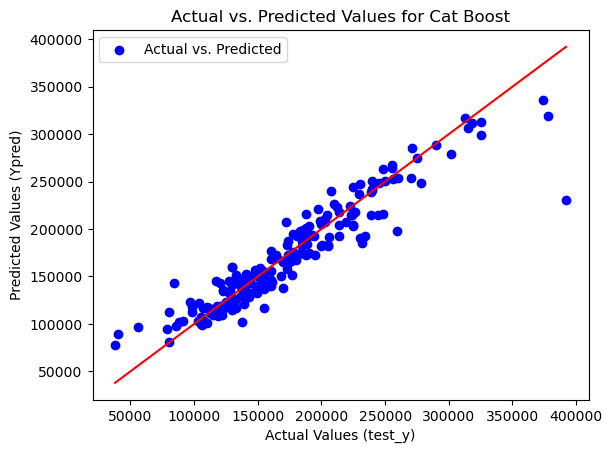

In [123]:
plt.scatter(y_test, y_pred, color='blue', label='Actual vs. Predicted')

# Plotting the diagonal line (abline(0,1))
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red')

# Adding labels and title
plt.xlabel('Actual Values (test_y)')
plt.ylabel('Predicted Values (Ypred)')
plt.title('Actual vs. Predicted Values for Cat Boost')

# Displaying the legend
plt.legend()

# Show the plot
plt.show()

In [124]:
mse.append(average_mse)
rmse.append(average_rmse)
r2.append(average_r2)
adj_r2_m.append(average_adj_r2)

# Feed Forward Neural networks

In [125]:
#pip install tensorflow

In [126]:
import tensorflow as tf
from tensorflow import keras

In [127]:
# Create a simple feedforward neural network using Keras
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(1) 
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')
#model.compile(loss='mean_squared_error', optimizer=opti,  metrics=['accuracy'])


In [128]:
# Train the neural network on the training data
hist = model.fit(X_train, y_train, validation_split=0.2, epochs=100, batch_size=32, verbose=0)


# Make predictions on the test set
y_pred = model.predict(X_test)



7/7 [==============================] - 0s 3ms/step


In [129]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                3072      
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 5185 (20.25 KB)
Trainable params: 5185 (20.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


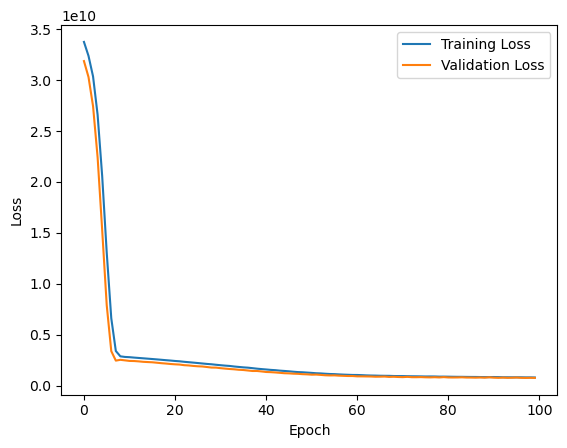

In [130]:
# Access the training and validation losses
training_loss = hist.history['loss']
validation_loss = hist.history['val_loss']

# Plot the training and validation losses
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [131]:
# Calculate the R-squared (R2) score and adjacent R2
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np


# Compute Mean Squared Error (MSE)
average_mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error (MSE): {average_mse:.8f}')

# Compute Root Mean Squared Error (RMSE)
average_rmse = np.sqrt(average_mse)
print(f'Root Mean Squared Error (RMSE): {average_rmse:.8f}')

average_r2 = r2_score(y_test, y_pred)

average_adj_r2 = 1 - (1 - average_r2) * ((n - 1) / (n - p - 1))
print(f"R2 for Neural Network : {average_r2}")
print(f"Adjacent R2 for Neural Network : {average_adj_r2}")

Mean Squared Error (MSE): 905983164.52749133
Root Mean Squared Error (RMSE): 30099.55422473
R2 for Neural Network : 0.7499156119824898
Adjacent R2 for Neural Network : 0.6740835717449222


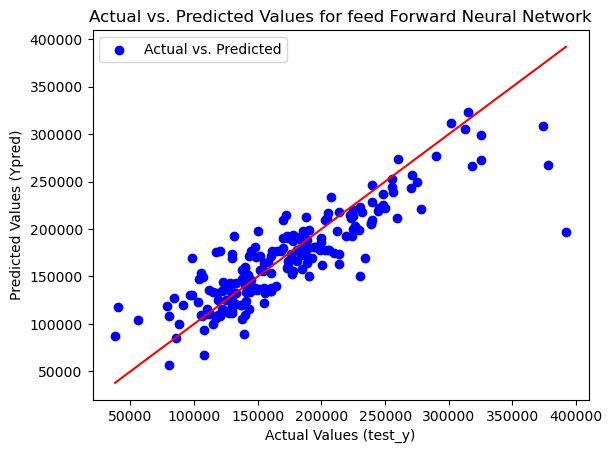

In [132]:
plt.scatter(y_test, y_pred, color='blue', label='Actual vs. Predicted')

# Plotting the diagonal line (abline(0,1))
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red')

# Adding labels and title
plt.xlabel('Actual Values (test_y)')
plt.ylabel('Predicted Values (Ypred)')
plt.title('Actual vs. Predicted Values for feed Forward Neural Network')

# Displaying the legend
plt.legend()

# Show the plot
plt.show()

In [133]:
mse.append(average_mse)
rmse.append(average_rmse)
r2.append(average_r2)
adj_r2_m.append(average_adj_r2)

## Convolutional Neural Network

In [134]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU, PReLU, ELU
from keras.layers import Dropout
from keras.losses import mean_squared_error
import keras.backend as K

In [135]:
df0 = pd.DataFrame()
df0 = df_no_outliers
out_col =['BsmtHalfBath','PoolArea','KitchenAbvGr']

nume_cols = df0.drop(columns=out_col,axis=1)

In [136]:
fn_df = pd.DataFrame()
fn_df = df0

In [137]:
fn_df

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,0,61,0,0,0,0,0,2,2008,208500
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,0,42,0,0,0,0,0,9,2008,223500
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,192,84,0,0,0,0,0,12,2008,250000
6,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,...,255,57,0,0,0,0,0,8,2007,307000
10,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,...,0,0,0,0,0,0,0,2,2008,129500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,RM,Pave,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,...,0,28,0,0,0,0,0,5,2006,145000
1453,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,...,36,56,0,0,0,0,0,7,2006,84500
1454,FV,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,...,0,113,0,0,0,0,0,10,2009,185000
1455,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,...,0,40,0,0,0,0,0,8,2007,175000


In [138]:
fn_df1

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SalePrice
0,3,1,3,3,0,4,0,5,2,1,...,548,0,61,0,0,0,0,2,2008,208500
2,3,1,0,3,0,4,0,5,2,1,...,608,0,42,0,0,0,0,9,2008,223500
4,3,1,0,3,0,2,0,15,2,1,...,836,192,84,0,0,0,0,12,2008,250000
6,3,1,3,3,0,4,0,21,2,1,...,636,255,57,0,0,0,0,8,2007,307000
10,3,1,3,3,0,4,0,19,2,1,...,384,0,0,0,0,0,0,2,2008,129500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,4,1,3,3,0,4,0,7,2,1,...,525,0,28,0,0,0,0,5,2006,145000
1453,3,1,3,3,0,4,0,11,2,1,...,0,36,56,0,0,0,0,7,2006,84500
1454,1,1,3,3,0,4,0,21,2,1,...,400,0,113,0,0,0,0,10,2009,185000
1455,3,1,3,3,0,4,0,8,2,1,...,460,0,40,0,0,0,0,8,2007,175000


In [139]:
from keras.models import Sequential
from keras.layers import Dense, Activation
from keras.layers import Convolution2D, MaxPooling2D, Flatten
#from keras.utils import np_utils

In [140]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Flatten, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

In [141]:
numerical_cols = fn_df[f_feature].select_dtypes(include=[np.number]).columns
categorical_cols = fn_df[f_feature].select_dtypes(exclude=[np.number]).columns

In [142]:
fn_df[f_feature].dtypes[1:50]

LotFrontage      float64
LotArea            int64
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
MasVnrArea       float64
BsmtFinSF1         int64
BsmtFinSF2         int64
TotalBsmtSF        int64
2ndFlrSF           int64
LowQualFinSF       int64
GrLivArea          int64
BsmtFullBath       int64
HalfBath           int64
BedroomAbvGr       int64
TotRmsAbvGrd       int64
Fireplaces         int64
GarageYrBlt      float64
GarageCars         int64
GarageArea         int64
WoodDeckSF         int64
OpenPorchSF        int64
EnclosedPorch      int64
ScreenPorch        int64
MiscVal            int64
MoSold             int64
YrSold             int64
MSZoning          object
LotShape          object
LotConfig         object
Neighborhood      object
BldgType          object
HouseStyle        object
RoofStyle         object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
ExterQual         object
BsmtQual          object


In [143]:
# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])


In [144]:
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

In [145]:
df_ml = fn_df[f_feature]

In [146]:
df_ml.iloc[:, :-1] #df

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,Exterior2nd,MasVnrType,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,CentralAir,KitchenQual,GarageType,GarageFinish
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,VinylSd,BrkFace,Gd,Gd,No,GLQ,Y,Gd,Attchd,RFn
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,...,VinylSd,BrkFace,Gd,Gd,Mn,GLQ,Y,Gd,Attchd,RFn
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,...,VinylSd,BrkFace,Gd,Gd,Av,GLQ,Y,Gd,Attchd,RFn
6,20,75.0,10084,8,5,2004,2005,186.0,1369,0,...,VinylSd,Stone,Gd,Ex,Av,GLQ,Y,Gd,Attchd,RFn
10,20,70.0,11200,5,5,1965,1965,0.0,906,0,...,HdBoard,None,TA,TA,No,Rec,Y,TA,Detchd,Unf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,180,35.0,3675,5,5,2005,2005,80.0,547,0,...,VinylSd,BrkFace,TA,Gd,Gd,GLQ,Y,TA,Basment,Fin
1453,20,90.0,17217,5,5,2006,2006,0.0,0,0,...,VinylSd,None,TA,Gd,No,Unf,Y,TA,Attchd,Unf
1454,20,62.0,7500,7,5,2004,2005,0.0,410,0,...,VinylSd,None,Gd,Gd,No,GLQ,Y,Gd,Attchd,RFn
1455,60,62.0,7917,6,5,1999,2000,0.0,0,0,...,VinylSd,None,TA,Gd,No,Unf,Y,TA,Attchd,RFn


In [147]:
num_data1 = df_ml.iloc[:, :-1].select_dtypes(include=[np.number])
nm1 = df_ml.iloc[:,-1]
nm =pd.DataFrame(nm1)
num_data2 = pd.concat([num_data1,nm], axis=1)
num_data = num_data2.astype(float)

In [148]:
num_data

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MiscVal,MoSold,YrSold,SalePrice
0,60.0,65.0,8450.0,7.0,5.0,2003.0,2003.0,196.0,706.0,0.0,...,2.0,548.0,0.0,61.0,0.0,0.0,0.0,2.0,2008.0,208500.0
2,60.0,68.0,11250.0,7.0,5.0,2001.0,2002.0,162.0,486.0,0.0,...,2.0,608.0,0.0,42.0,0.0,0.0,0.0,9.0,2008.0,223500.0
4,60.0,84.0,14260.0,8.0,5.0,2000.0,2000.0,350.0,655.0,0.0,...,3.0,836.0,192.0,84.0,0.0,0.0,0.0,12.0,2008.0,250000.0
6,20.0,75.0,10084.0,8.0,5.0,2004.0,2005.0,186.0,1369.0,0.0,...,2.0,636.0,255.0,57.0,0.0,0.0,0.0,8.0,2007.0,307000.0
10,20.0,70.0,11200.0,5.0,5.0,1965.0,1965.0,0.0,906.0,0.0,...,1.0,384.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,129500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,180.0,35.0,3675.0,5.0,5.0,2005.0,2005.0,80.0,547.0,0.0,...,2.0,525.0,0.0,28.0,0.0,0.0,0.0,5.0,2006.0,145000.0
1453,20.0,90.0,17217.0,5.0,5.0,2006.0,2006.0,0.0,0.0,0.0,...,0.0,0.0,36.0,56.0,0.0,0.0,0.0,7.0,2006.0,84500.0
1454,20.0,62.0,7500.0,7.0,5.0,2004.0,2005.0,0.0,410.0,0.0,...,2.0,400.0,0.0,113.0,0.0,0.0,0.0,10.0,2009.0,185000.0
1455,60.0,62.0,7917.0,6.0,5.0,1999.0,2000.0,0.0,0.0,0.0,...,2.0,460.0,0.0,40.0,0.0,0.0,0.0,8.0,2007.0,175000.0


In [149]:
num_data.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MiscVal,MoSold,YrSold,SalePrice
0,60.0,65.0,8450.0,7.0,5.0,2003.0,2003.0,196.0,706.0,0.0,...,2.0,548.0,0.0,61.0,0.0,0.0,0.0,2.0,2008.0,208500.0
2,60.0,68.0,11250.0,7.0,5.0,2001.0,2002.0,162.0,486.0,0.0,...,2.0,608.0,0.0,42.0,0.0,0.0,0.0,9.0,2008.0,223500.0
4,60.0,84.0,14260.0,8.0,5.0,2000.0,2000.0,350.0,655.0,0.0,...,3.0,836.0,192.0,84.0,0.0,0.0,0.0,12.0,2008.0,250000.0
6,20.0,75.0,10084.0,8.0,5.0,2004.0,2005.0,186.0,1369.0,0.0,...,2.0,636.0,255.0,57.0,0.0,0.0,0.0,8.0,2007.0,307000.0
10,20.0,70.0,11200.0,5.0,5.0,1965.0,1965.0,0.0,906.0,0.0,...,1.0,384.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,129500.0


In [150]:
cat_data = df_ml.select_dtypes(exclude=[np.number])

In [151]:
cat_data

,MSZoning,LotShape,LotConfig,Neighborhood,BldgType,HouseStyle,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,ExterQual,BsmtQual,BsmtExposure,BsmtFinType1,CentralAir,KitchenQual,GarageType,GarageFinish
0,RL,Reg,Inside,CollgCr,1Fam,2Story,Gable,VinylSd,VinylSd,BrkFace,Gd,Gd,No,GLQ,Y,Gd,Attchd,RFn
2,RL,IR1,Inside,CollgCr,1Fam,2Story,Gable,VinylSd,VinylSd,BrkFace,Gd,Gd,Mn,GLQ,Y,Gd,Attchd,RFn
4,RL,IR1,FR2,NoRidge,1Fam,2Story,Gable,VinylSd,VinylSd,BrkFace,Gd,Gd,Av,GLQ,Y,Gd,Attchd,RFn
6,RL,Reg,Inside,Somerst,1Fam,1Story,Gable,VinylSd,VinylSd,Stone,Gd,Ex,Av,GLQ,Y,Gd,Attchd,RFn
10,RL,Reg,Inside,Sawyer,1Fam,1Story,Hip,HdBoard,HdBoard,None,TA,TA,No,Rec,Y,TA,Detchd,Unf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,RM,Reg,Inside,Edwards,TwnhsE,SLvl,Gable,VinylSd,VinylSd,BrkFace,TA,Gd,Gd,GLQ,Y,TA,Basment,Fin
1453,RL,Reg,Inside,Mitchel,1Fam,1Story,Gable,VinylSd,VinylSd,None,TA,Gd,No,Unf,Y,TA,Attchd,Unf
1454,FV,Reg,Inside,Somerst,1Fam,1Story,Gable,VinylSd,VinylSd,None,Gd,Gd,No,GLQ,Y,Gd,Attchd,RFn
1455,RL,Reg,Inside,Gilbert,1Fam,2Story,Gable,VinylSd,VinylSd,None,TA,Gd,No,Unf,Y,TA,Attchd,RFn


In [152]:
dff = pd.DataFrame()
dff = pd.concat([cat_data,num_data],axis=1)

In [153]:
dff


,MSZoning,LotShape,LotConfig,Neighborhood,BldgType,HouseStyle,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MiscVal,MoSold,YrSold,SalePrice
0,RL,Reg,Inside,CollgCr,1Fam,2Story,Gable,VinylSd,VinylSd,BrkFace,...,2.0,548.0,0.0,61.0,0.0,0.0,0.0,2.0,2008.0,208500.0
2,RL,IR1,Inside,CollgCr,1Fam,2Story,Gable,VinylSd,VinylSd,BrkFace,...,2.0,608.0,0.0,42.0,0.0,0.0,0.0,9.0,2008.0,223500.0
4,RL,IR1,FR2,NoRidge,1Fam,2Story,Gable,VinylSd,VinylSd,BrkFace,...,3.0,836.0,192.0,84.0,0.0,0.0,0.0,12.0,2008.0,250000.0
6,RL,Reg,Inside,Somerst,1Fam,1Story,Gable,VinylSd,VinylSd,Stone,...,2.0,636.0,255.0,57.0,0.0,0.0,0.0,8.0,2007.0,307000.0
10,RL,Reg,Inside,Sawyer,1Fam,1Story,Hip,HdBoard,HdBoard,None,...,1.0,384.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,129500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,RM,Reg,Inside,Edwards,TwnhsE,SLvl,Gable,VinylSd,VinylSd,BrkFace,...,2.0,525.0,0.0,28.0,0.0,0.0,0.0,5.0,2006.0,145000.0
1453,RL,Reg,Inside,Mitchel,1Fam,1Story,Gable,VinylSd,VinylSd,None,...,0.0,0.0,36.0,56.0,0.0,0.0,0.0,7.0,2006.0,84500.0
1454,FV,Reg,Inside,Somerst,1Fam,1Story,Gable,VinylSd,VinylSd,None,...,2.0,400.0,0.0,113.0,0.0,0.0,0.0,10.0,2009.0,185000.0
1455,RL,Reg,Inside,Gilbert,1Fam,2Story,Gable,VinylSd,VinylSd,None,...,2.0,460.0,0.0,40.0,0.0,0.0,0.0,8.0,2007.0,175000.0


In [154]:
dff_pre1 = preprocessor.fit_transform(dff)

In [155]:
num_data['SalePrice']

0       208500.0
2       223500.0
4       250000.0
6       307000.0
10      129500.0
          ...   
1452    145000.0
1453     84500.0
1454    185000.0
1455    175000.0
1456    210000.0
Name: SalePrice, Length: 1015, dtype: float64

In [156]:
# Remove the last column
modified_array = dff_pre1[:, :-1]

# Add a new column
new_column = np.array(num_data['SalePrice'])

# Stack the new column horizontally
dff_pre = np.column_stack((modified_array, new_column))

In [157]:
dff_pre

array([[ 1.50409395e-01, -1.30313075e-01, -1.89854120e-01, ...,
         0.00000000e+00,  1.00000000e+00,  2.08500000e+05],
       [ 1.50409395e-01,  3.35408412e-02,  5.80943698e-01, ...,
         0.00000000e+00,  1.00000000e+00,  2.23500000e+05],
       [ 1.50409395e-01,  9.07428396e-01,  1.40955135e+00, ...,
         0.00000000e+00,  1.00000000e+00,  2.50000000e+05],
       ...,
       [-8.40925252e-01, -2.94166992e-01, -4.51374809e-01, ...,
         0.00000000e+00,  1.00000000e+00,  1.85000000e+05],
       [ 1.50409395e-01, -2.94166992e-01, -3.36580991e-01, ...,
         0.00000000e+00,  1.00000000e+00,  1.75000000e+05],
       [-8.40925252e-01,  9.62046368e-01,  1.11086720e+00, ...,
         0.00000000e+00,  0.00000000e+00,  2.10000000e+05]])

In [158]:
dff_pre[:,-1]

array([208500., 223500., 250000., ..., 185000., 175000., 210000.])

In [159]:
dff_pre[:, :-1]   #my_array_without_last_column = my_array[:, :-1]

array([[ 0.15040939, -0.13031308, -0.18985412, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.15040939,  0.03354084,  0.5809437 , ...,  0.        ,
         0.        ,  1.        ],
       [ 0.15040939,  0.9074284 ,  1.40955135, ...,  0.        ,
         0.        ,  1.        ],
       ...,
       [-0.84092525, -0.29416699, -0.45137481, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.15040939, -0.29416699, -0.33658099, ...,  0.        ,
         0.        ,  1.        ],
       [-0.84092525,  0.96204637,  1.1108672 , ...,  0.        ,
         0.        ,  0.        ]])

In [160]:
X = dff_pre[:, :-1]
y = dff_pre[:,-1]

In [161]:
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [162]:
Input = []

In [163]:
# Reshape the data to fit the Conv1D input shape
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

# Build the CNN model
model2 = Sequential()
model2.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)))
model2.add(MaxPooling1D(pool_size=2))
model2.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
model2.add(MaxPooling1D(pool_size=2))
model2.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
model2.add(MaxPooling1D(pool_size=2))
model2.add(Flatten())
model2.add(Dense(256, activation='relu',kernel_regularizer=l2(0.01)))
model2.add(Dropout(0.5))
model2.add(Dense(256, activation='relu',kernel_regularizer=l2(0.01)))
model2.add(Dropout(0.5))
model2.add(Dense(128, activation='relu',kernel_regularizer=l2(0.01)))
model2.add(Dropout(0.5))
model2.add(Dense(1, activation='relu',kernel_regularizer=l2(0.01)))

In [164]:
# Build the CNN model with more layers
model3 = Sequential()
model3.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)))
model3.add(MaxPooling1D(pool_size=2))
model3.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
model3.add(MaxPooling1D(pool_size=2))
model3.add(Conv1D(filters=256, kernel_size=3, activation='relu'))
model3.add(MaxPooling1D(pool_size=2))
model3.add(Flatten())
model3.add(Dense(units=128, activation='relu'))
model3.add(Dense(units=64, activation='relu'))
model3.add(Dense(units=1))

from tensorflow.keras.layers import Dropout

from tensorflow.keras.regularizers import l2
model.add(Dropout(0.5))  # Example of dropout
model.add(Dense(128, activation='relu', kernel_regularizer=l2(0.01)))


In [165]:
# Compile the model
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Use a learning rate schedule
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.0001)

model3.compile(optimizer=Adam(lr=0.001), loss='mean_squared_error')


In [166]:
# Display the model summary
model3.summary()
#


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 147, 64)           256       
                                                                 
 max_pooling1d (MaxPooling1  (None, 73, 64)            0         
 D)                                                              
                                                                 
 conv1d_1 (Conv1D)           (None, 71, 128)           24704     
                                                                 
 max_pooling1d_1 (MaxPoolin  (None, 35, 128)           0         
 g1D)                                                            
                                                                 
 conv1d_2 (Conv1D)           (None, 33, 256)           98560     
                                                                 
 max_pooling1d_2 (MaxPoolin  (None, 16, 256)          

In [167]:
# Train the model
hist_fit = model3.fit(X_train, y_train, epochs=500, batch_size=32, validation_split=0.2,  callbacks=[reduce_lr])

Epoch 1/500
21/21 [==============================] - 3s 42ms/step - loss: 34147731456.0000 - val_loss: 33212422144.0000 - lr: 0.0010
Epoch 2/500
21/21 [==============================] - 0s 21ms/step - loss: 30711326720.0000 - val_loss: 20367226880.0000 - lr: 0.0010
Epoch 3/500
21/21 [==============================] - 0s 22ms/step - loss: 9736554496.0000 - val_loss: 3458230272.0000 - lr: 0.0010
Epoch 4/500
21/21 [==============================] - 0s 19ms/step - loss: 4036721920.0000 - val_loss: 3152219136.0000 - lr: 0.0010
Epoch 5/500
21/21 [==============================] - 0s 19ms/step - loss: 3350201088.0000 - val_loss: 3008397056.0000 - lr: 0.0010
Epoch 6/500
21/21 [==============================] - 0s 22ms/step - loss: 2997050880.0000 - val_loss: 2525502208.0000 - lr: 0.0010
Epoch 7/500
21/21 [==============================] - 0s 20ms/step - loss: 2622649856.0000 - val_loss: 2292658176.0000 - lr: 0.0010
Epoch 8/500
21/21 [==============================] - 0s 22ms/step - loss: 23581

Epoch 126/500
21/21 [==============================] - 1s 28ms/step - loss: 270297856.0000 - val_loss: 313393792.0000 - lr: 0.0010
Epoch 127/500
21/21 [==============================] - 0s 22ms/step - loss: 264839984.0000 - val_loss: 305127488.0000 - lr: 0.0010
Epoch 128/500
21/21 [==============================] - 0s 22ms/step - loss: 262772784.0000 - val_loss: 361981408.0000 - lr: 0.0010
Epoch 129/500
21/21 [==============================] - 0s 23ms/step - loss: 282694464.0000 - val_loss: 298285728.0000 - lr: 0.0010
Epoch 130/500
21/21 [==============================] - 0s 21ms/step - loss: 305619776.0000 - val_loss: 297195296.0000 - lr: 0.0010
Epoch 131/500
21/21 [==============================] - 0s 22ms/step - loss: 258322944.0000 - val_loss: 310385920.0000 - lr: 0.0010
Epoch 132/500
21/21 [==============================] - 0s 19ms/step - loss: 255655280.0000 - val_loss: 341647776.0000 - lr: 0.0010
Epoch 133/500
21/21 [==============================] - 0s 22ms/step - loss: 2619262

Epoch 249/500
21/21 [==============================] - 1s 28ms/step - loss: 115406536.0000 - val_loss: 175938304.0000 - lr: 1.0000e-04
Epoch 250/500
21/21 [==============================] - 1s 30ms/step - loss: 116172016.0000 - val_loss: 180383392.0000 - lr: 1.0000e-04
Epoch 251/500
21/21 [==============================] - 1s 26ms/step - loss: 115031896.0000 - val_loss: 175760592.0000 - lr: 1.0000e-04
Epoch 252/500
21/21 [==============================] - 1s 45ms/step - loss: 116261648.0000 - val_loss: 175412112.0000 - lr: 1.0000e-04
Epoch 253/500
21/21 [==============================] - 1s 36ms/step - loss: 116355264.0000 - val_loss: 180494544.0000 - lr: 1.0000e-04
Epoch 254/500
21/21 [==============================] - 1s 43ms/step - loss: 119465184.0000 - val_loss: 177088544.0000 - lr: 1.0000e-04
Epoch 255/500
21/21 [==============================] - 1s 50ms/step - loss: 119093504.0000 - val_loss: 175721232.0000 - lr: 1.0000e-04
Epoch 256/500
21/21 [==============================] - 

Epoch 310/500
21/21 [==============================] - 1s 26ms/step - loss: 104781928.0000 - val_loss: 174047136.0000 - lr: 1.0000e-04
Epoch 311/500
21/21 [==============================] - 1s 26ms/step - loss: 105556504.0000 - val_loss: 166964400.0000 - lr: 1.0000e-04
Epoch 312/500
21/21 [==============================] - 1s 24ms/step - loss: 106754720.0000 - val_loss: 166919408.0000 - lr: 1.0000e-04
Epoch 313/500
21/21 [==============================] - 0s 20ms/step - loss: 105580872.0000 - val_loss: 167443232.0000 - lr: 1.0000e-04
Epoch 314/500
21/21 [==============================] - 1s 36ms/step - loss: 104067056.0000 - val_loss: 167249584.0000 - lr: 1.0000e-04
Epoch 315/500
21/21 [==============================] - 0s 23ms/step - loss: 106545920.0000 - val_loss: 165893360.0000 - lr: 1.0000e-04
Epoch 316/500
21/21 [==============================] - 0s 23ms/step - loss: 104097048.0000 - val_loss: 169630688.0000 - lr: 1.0000e-04
Epoch 317/500
21/21 [==============================] - 

Epoch 371/500
21/21 [==============================] - 1s 32ms/step - loss: 95308544.0000 - val_loss: 158587568.0000 - lr: 1.0000e-04
Epoch 372/500
21/21 [==============================] - 1s 26ms/step - loss: 94746416.0000 - val_loss: 157690592.0000 - lr: 1.0000e-04
Epoch 373/500
21/21 [==============================] - 1s 25ms/step - loss: 94156824.0000 - val_loss: 160344400.0000 - lr: 1.0000e-04
Epoch 374/500
21/21 [==============================] - 1s 31ms/step - loss: 94641720.0000 - val_loss: 157558336.0000 - lr: 1.0000e-04
Epoch 375/500
21/21 [==============================] - 1s 34ms/step - loss: 94517800.0000 - val_loss: 156552736.0000 - lr: 1.0000e-04
Epoch 376/500
21/21 [==============================] - 1s 31ms/step - loss: 96376000.0000 - val_loss: 156794208.0000 - lr: 1.0000e-04
Epoch 377/500
21/21 [==============================] - 1s 31ms/step - loss: 95370952.0000 - val_loss: 156522592.0000 - lr: 1.0000e-04
Epoch 378/500
21/21 [==============================] - 1s 30ms

21/21 [==============================] - 1s 38ms/step - loss: 77397296.0000 - val_loss: 141334576.0000 - lr: 1.0000e-04
Epoch 494/500
21/21 [==============================] - 1s 36ms/step - loss: 77304032.0000 - val_loss: 140373856.0000 - lr: 1.0000e-04
Epoch 495/500
21/21 [==============================] - 1s 26ms/step - loss: 77161008.0000 - val_loss: 140371360.0000 - lr: 1.0000e-04
Epoch 496/500
21/21 [==============================] - 1s 24ms/step - loss: 76380336.0000 - val_loss: 148747808.0000 - lr: 1.0000e-04
Epoch 497/500
21/21 [==============================] - 1s 24ms/step - loss: 80190160.0000 - val_loss: 141463872.0000 - lr: 1.0000e-04
Epoch 498/500
21/21 [==============================] - 1s 37ms/step - loss: 79651840.0000 - val_loss: 143908064.0000 - lr: 1.0000e-04
Epoch 499/500
21/21 [==============================] - 1s 31ms/step - loss: 77907632.0000 - val_loss: 141196816.0000 - lr: 1.0000e-04
Epoch 500/500
21/21 [==============================] - 1s 29ms/step - loss: 

In [168]:
# Access the training and validation losses
training_loss = hist_fit.history['loss']
validation_loss = hist_fit.history['val_loss']

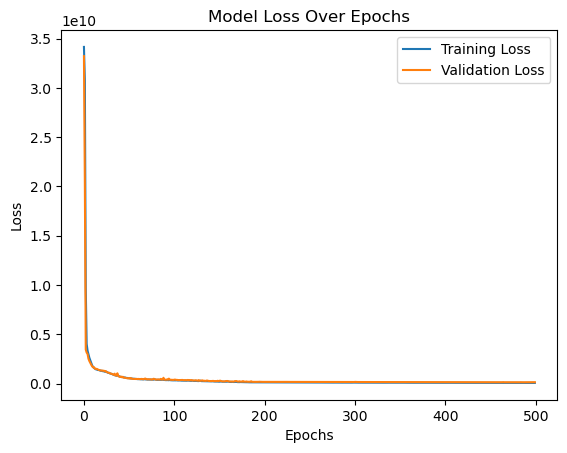

In [169]:
# Plot the training and validation loss
plt.plot(hist_fit.history['loss'], label='Training Loss')
plt.plot(hist_fit.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()



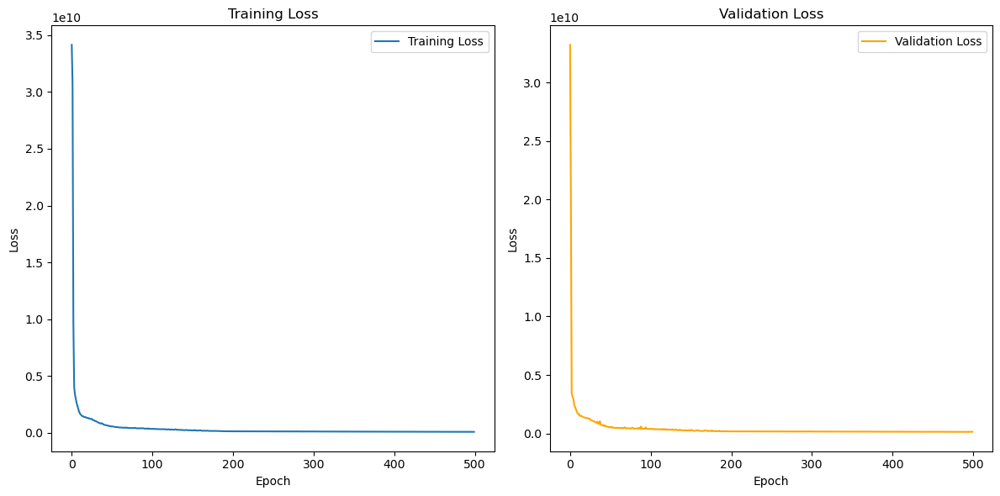

In [170]:
# Plot training loss and validation loss
plt.figure(figsize=(12, 6))

# Plot training loss
plt.subplot(1, 2, 1)
plt.plot(hist_fit.history['loss'], label='Training Loss')
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot validation loss
plt.subplot(1, 2, 2)
plt.plot(hist_fit.history['val_loss'], label='Validation Loss', color='orange')
plt.title('Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [171]:
ypred = model3.predict(X_test)


7/7 [==============================] - 0s 9ms/step


In [172]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Assuming 'predictions' and 'y_test' are your model predictions and true values, respectively

# Compute Mean Squared Error (MSE)
average_mse = mean_squared_error(y_test, ypred)
print(f'Mean Squared Error (MSE): {average_mse:.8f}')

# Compute Root Mean Squared Error (RMSE)
average_rmse = np.sqrt(average_mse)
print(f'Root Mean Squared Error (RMSE): {average_rmse:.8f}')

# Compute R-squared (R2)
average_r2 = r2_score(y_test, ypred)
print(f'R-squared (R2): {average_r2:.8f}')

# Compute Adjusted R-squared (adj-R2)
n = len(y_test)  # number of samples
p = dff.shape[1]-1  # number of features

# Calculate adjusted R-squared
average_adj_r2 = 1 - (1 - average_r2) * (n - 1) / (n - p - 1)
print(f'Adjusted R-squared (adj-R2): {average_adj_r2:.8f}')


Mean Squared Error (MSE): 138118730.01821613
Root Mean Squared Error (RMSE): 11752.39252315
R-squared (R2): 0.96557733
Adjusted R-squared (adj-R2): 0.95513949


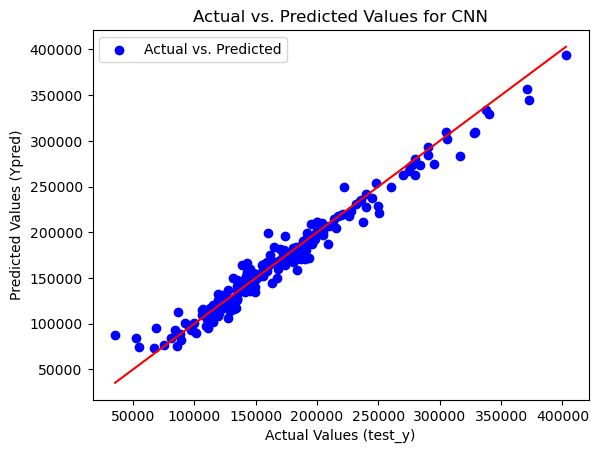

In [173]:
plt.scatter(y_test, ypred, color='blue', label='Actual vs. Predicted')

# Plotting the diagonal line (abline(0,1))
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red')

# Adding labels and title
plt.xlabel('Actual Values (test_y)')
plt.ylabel('Predicted Values (Ypred)')
plt.title('Actual vs. Predicted Values for CNN')

# Displaying the legend
plt.legend()

# Show the plot
plt.show()

In [174]:
mse.append(average_mse)
rmse.append(average_rmse)
r2.append(average_r2)
adj_r2_m.append(average_adj_r2)

# Artificial Neural Network

In [175]:
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU, PReLU, ELU
from keras.layers import Dropout
from keras.losses import mean_squared_error
import keras.backend as K

In [176]:
# Define custom RMSE loss function
def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(mean_squared_error(y_true, y_pred))


In [177]:
fn_df0 = pd.DataFrame()
fn_df0 = fn_df1[f_feature]

In [178]:
X=fn_df0.drop(columns=['SalePrice'],axis=1)
y=fn_df0['SalePrice']

In [179]:
fn_df1

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SalePrice
0,3,1,3,3,0,4,0,5,2,1,...,548,0,61,0,0,0,0,2,2008,208500
2,3,1,0,3,0,4,0,5,2,1,...,608,0,42,0,0,0,0,9,2008,223500
4,3,1,0,3,0,2,0,15,2,1,...,836,192,84,0,0,0,0,12,2008,250000
6,3,1,3,3,0,4,0,21,2,1,...,636,255,57,0,0,0,0,8,2007,307000
10,3,1,3,3,0,4,0,19,2,1,...,384,0,0,0,0,0,0,2,2008,129500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1452,4,1,3,3,0,4,0,7,2,1,...,525,0,28,0,0,0,0,5,2006,145000
1453,3,1,3,3,0,4,0,11,2,1,...,0,36,56,0,0,0,0,7,2006,84500
1454,1,1,3,3,0,4,0,21,2,1,...,400,0,113,0,0,0,0,10,2009,185000
1455,3,1,3,3,0,4,0,8,2,1,...,460,0,40,0,0,0,0,8,2007,175000


In [180]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [181]:
X.shape,y.shape

((1015, 47), (1015,))

In [182]:
# Convert data types to float32
X_train = X_train.astype('float32')
y_train = y_train.astype('float32')


In [183]:

# Initialize the ANN
model1 = Sequential()

# Adding the input layer and the first hidden layer
model1.add(Dense(units=50, kernel_initializer='he_uniform', activation='relu', input_dim=X_train.shape[1]))

# Adding the second hidden layer
model1.add(Dense(units=25, kernel_initializer='he_uniform', activation='relu'))

# Adding the third hidden layer
model1.add(Dense(units=50, kernel_initializer='he_uniform', activation='relu'))

# Adding the output layer
model1.add(Dense(units=1, kernel_initializer='he_uniform'))

# Compile the ANN
model1.compile(loss=root_mean_squared_error, optimizer='Adamax')


In [184]:
model1.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 50)                2400      
                                                                 
 dense_7 (Dense)             (None, 25)                1275      
                                                                 
 dense_8 (Dense)             (None, 50)                1300      
                                                                 
 dense_9 (Dense)             (None, 1)                 51        
                                                                 
Total params: 5026 (19.63 KB)
Trainable params: 5026 (19.63 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [185]:

# Fitting the ANN to the Training set
model_fit = model1.fit(X_train.values, y_train.values, validation_split=0.20, batch_size=10, epochs=100)

Epoch 1/100
65/65 [==============================] - 2s 9ms/step - loss: 164941.8438 - val_loss: 152719.0000
Epoch 2/100
65/65 [==============================] - 0s 5ms/step - loss: 125056.7422 - val_loss: 87977.4766
Epoch 3/100
65/65 [==============================] - 0s 5ms/step - loss: 54172.9297 - val_loss: 43645.7578
Epoch 4/100
65/65 [==============================] - 0s 5ms/step - loss: 42116.8672 - val_loss: 42898.4609
Epoch 5/100
65/65 [==============================] - 0s 5ms/step - loss: 41680.1836 - val_loss: 42287.7070
Epoch 6/100
65/65 [==============================] - 0s 6ms/step - loss: 41028.6055 - val_loss: 41748.4766
Epoch 7/100
65/65 [==============================] - 0s 5ms/step - loss: 40408.0586 - val_loss: 41024.3164
Epoch 8/100
65/65 [==============================] - 0s 6ms/step - loss: 39950.0469 - val_loss: 40230.0234
Epoch 9/100
65/65 [==============================] - 0s 5ms/step - loss: 39232.0000 - val_loss: 39641.1445
Epoch 10/100
65/65 [==============

Epoch 77/100
65/65 [==============================] - 0s 5ms/step - loss: 20647.3672 - val_loss: 21252.8301
Epoch 78/100
65/65 [==============================] - 0s 6ms/step - loss: 20487.1914 - val_loss: 21241.1934
Epoch 79/100
65/65 [==============================] - 0s 5ms/step - loss: 20677.3242 - val_loss: 22008.3379
Epoch 80/100
65/65 [==============================] - 0s 6ms/step - loss: 20450.6973 - val_loss: 21938.0879
Epoch 81/100
65/65 [==============================] - 0s 5ms/step - loss: 20623.6035 - val_loss: 21399.0742
Epoch 82/100
65/65 [==============================] - 0s 6ms/step - loss: 20498.5371 - val_loss: 21977.3984
Epoch 83/100
65/65 [==============================] - 0s 4ms/step - loss: 20510.6465 - val_loss: 21267.6562
Epoch 84/100
65/65 [==============================] - 0s 4ms/step - loss: 20354.6816 - val_loss: 22188.0684
Epoch 85/100
65/65 [==============================] - 0s 4ms/step - loss: 20415.0078 - val_loss: 21326.6699
Epoch 86/100
65/65 [========

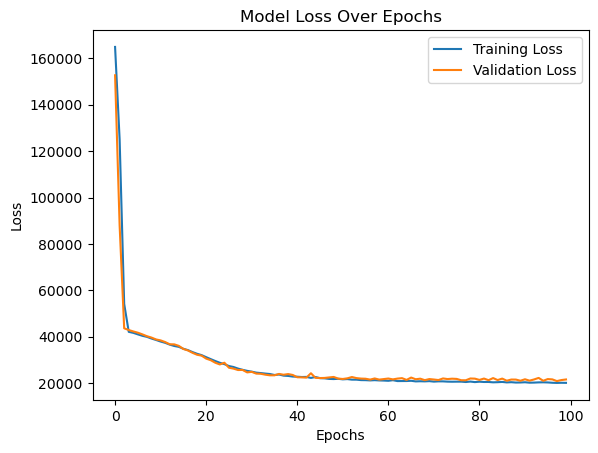

In [186]:
# Plot the training and validation loss
plt.plot(model_fit.history['loss'], label='Training Loss')
plt.plot(model_fit.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [187]:

from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Make predictions on the test set
y_pred = model1.predict(X_test)
# Compute Mean Squared Error (MSE)
average_mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error (MSE): {average_mse:.8f}')

# Compute Root Mean Squared Error (RMSE)
average_rmse = np.sqrt(average_mse)
print(f'Root Mean Squared Error (RMSE): {average_rmse:.8f}')

# Compute R-squared (R2)
average_r2 = r2_score(y_test, y_pred)
print(f'R-squared (R2): {average_r2:.8f}')

# Compute Adjusted R-squared (adj-R2)
n = len(y_test)  # number of samples
p = X_test.shape[1]  # number of features

# Calculate adjusted R-squared
average_adj_r2 = 1 - (1 - average_r2) * (n - 1) / (n - p - 1)
print(f'Adjusted R-squared (adj-R2): {average_adj_r2:.8f}')

7/7 [==============================] - 0s 2ms/step
Mean Squared Error (MSE): 815883332.09314716
Root Mean Squared Error (RMSE): 28563.67154434
R-squared (R2): 0.79666129
Adjusted R-squared (adj-R2): 0.73500374


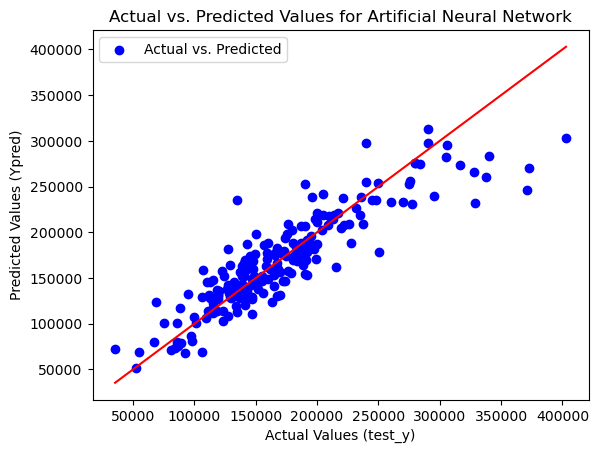

In [188]:
plt.scatter(y_test, y_pred, color='blue', label='Actual vs. Predicted')

# Plotting the diagonal line (abline(0,1))
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red')

# Adding labels and title
plt.xlabel('Actual Values (test_y)')
plt.ylabel('Predicted Values (Ypred)')
plt.title('Actual vs. Predicted Values for Artificial Neural Network')

# Displaying the legend
plt.legend()

# Show the plot
plt.show()

In [189]:
mse.append(average_mse)
rmse.append(average_rmse)
r2.append(average_r2)
adj_r2_m.append(average_adj_r2)

In [190]:
print("Mean Square Error : ",mse,"\n")
print("Root Mean Square Error : ",rmse,"\n")
print("R Squared : ",r2,"\n")
print("Adjacent R Squared : ",adj_r2_m,"\n")

Mean Square Error :  [420650937.9779725, 453098548.05749834, 409451395.1456501, 395455793.7554444, 377342030.238856, 905983164.5274913, 138118730.01821613, 815883332.0931472] 

Root Mean Square Error :  [20457.410527271706, 21114.035162434848, 20166.833922586626, 19836.044545360783, 19356.55567554997, 30099.554224730495, 11752.392523151026, 28563.67154434365] 

R Squared :  [0.8941244079883246, 0.8874028322004393, 0.8974315595716839, 0.9006649434338568, 0.9056084389043658, 0.7499156119824898, 0.9655773277952051, 0.7966612892089714] 

Adjacent R Squared :  [0.8620201962170423, 0.8532604651902498, 0.8663301615063235, 0.8705439907976716, 0.8769864816689154, 0.6740835717449222, 0.9551394852556867, 0.7350037446465305] 



In [193]:
name = []
name = ['LR','RF','GBR','XGB','CB','FNN','CNN','ANN']
name

['LR', 'RF', 'GBR', 'XGB', 'CB', 'FNN', 'CNN', 'ANN']

## Comparison of Model using Visualization

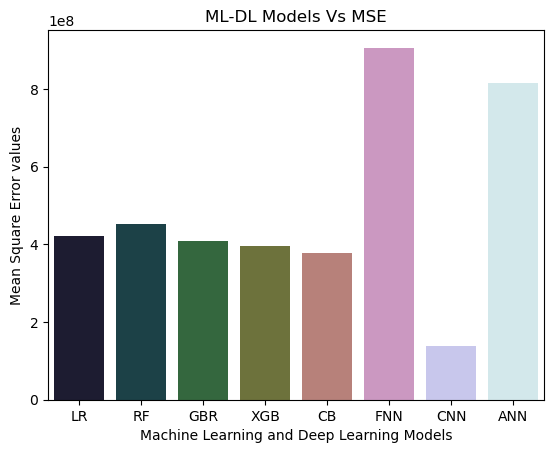

In [194]:
res_mse = {'method':name,'Score':mse}
df_mse = pd.DataFrame(res_mse)
# Plotting the bar plot with seaborn
ax=sns.barplot(x='method', y='Score', data=df_mse, palette='cubehelix')

# Adding labels and title
plt.xlabel('Machine Learning and Deep Learning Models')
plt.ylabel('Mean Square Error values')
plt.title('ML-DL Models Vs MSE')
#for index, value in enumerate(mse):
#    ax.text(index, value, f'{round(value, 2)}', ha='center', va='bottom', fontweight='bold')


# Display the plot
plt.show()

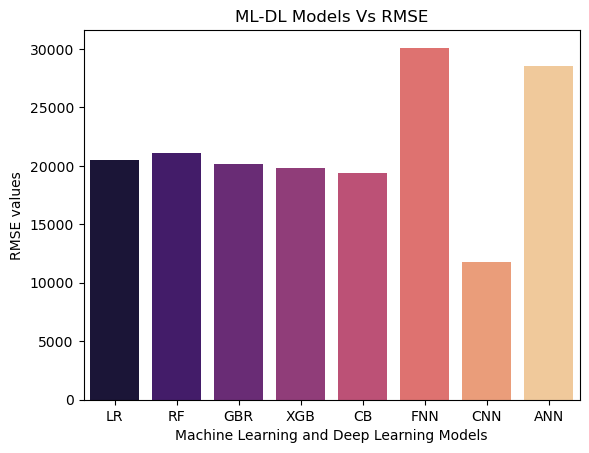

In [195]:

res_rmse = {'method':name,'Score':rmse}
df_rmse = pd.DataFrame(res_rmse)
# Plotting the bar plot with seaborn
ax=sns.barplot(x='method', y='Score', data=df_rmse, palette='magma')

# Adding labels and title
plt.xlabel('Machine Learning and Deep Learning Models')
plt.ylabel('RMSE values')
plt.title('ML-DL Models Vs RMSE')
#for index, value in enumerate(r21):
#    ax.text(index, value, f'{round(value, 2)}', ha='center', va='bottom', fontweight='bold')


# Display the plot
plt.show()

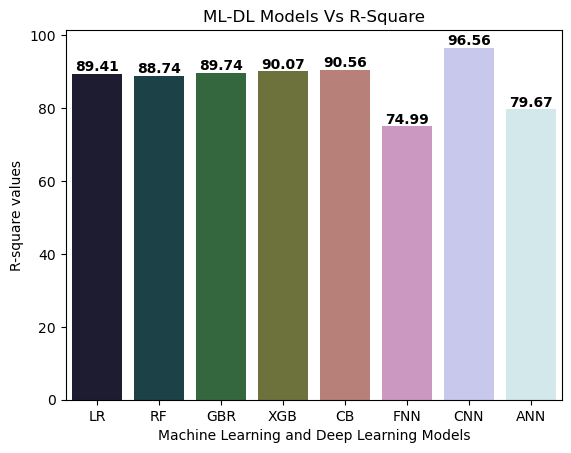

In [196]:
r21 =[x * 100 for x in r2]
res_r2 = {'method':name,'Score':r21}
df_r2 = pd.DataFrame(res_r2)
# Plotting the bar plot with seaborn
ax=sns.barplot(x='method', y='Score', data=df_r2, palette='cubehelix')

# Adding labels and title
plt.xlabel('Machine Learning and Deep Learning Models')
plt.ylabel('R-square values')
plt.title('ML-DL Models Vs R-Square')
for index, value in enumerate(r21):
    ax.text(index, value, f'{round(value, 2)}', ha='center', va='bottom', fontweight='bold')


# Display the plot
plt.show()


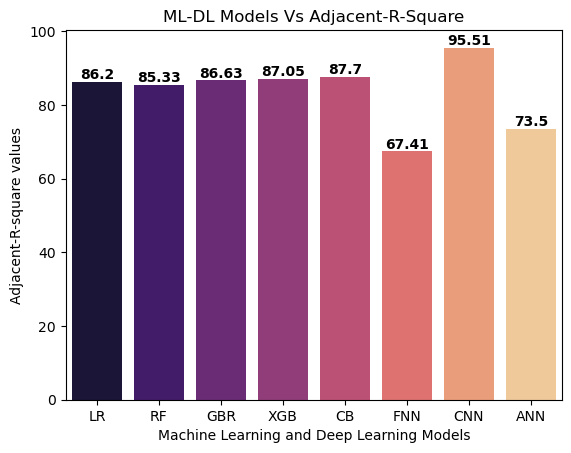

In [197]:
adj_r2_m1 =[x * 100 for x in adj_r2_m]
res_adj_r2 = {'method':name,'Score':adj_r2_m1}
df_adj_r2 = pd.DataFrame(res_adj_r2)
# Plotting the bar plot with seaborn
mx = sns.barplot(x='method', y='Score', data=df_adj_r2, palette='magma')

for index, value in enumerate(adj_r2_m1):
    mx.text(index, value, f'{round(value, 2)}', ha='center', va='bottom', fontweight='bold')
# Adding labels and title
plt.xlabel('Machine Learning and Deep Learning Models')
plt.ylabel('Adjacent-R-square values')
plt.title('ML-DL Models Vs Adjacent-R-Square')

# Display the plot
plt.show()
